# Examples on dimensionality reduction

Sources: Nonlinear Dimensionality Reduction (Lee & Verleysen 2007)<br>
http://scikit-learn.org/stable/modules/manifold.html#multidimensional-scaling

In [1]:
#%matplotlib inline
%matplotlib notebook
import numpy as np
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import math
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from IPython.display import display_html
from IPython.display import display

def display_sbs(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    html_str = html_str.replace('table','table style="display:inline; border:0px"')          
    display_html(html_str,raw=True)

np.random.seed(seed=1)
seed = np.random.RandomState(seed=1337)

In [2]:
def scatter3D(df,**kwargs):
    """
    Function to plot 3D scatter plot.
    Takes as innput a pandas data frame
    with shape (x, 3).
    
    Notes:
     - requires matplotlib to be imported as
       import matplotlib.pyplot as plt
    
    Versioning
    - 0.1 by Ville Voutilainen
        Initial build
    """
    from mpl_toolkits.mplot3d import Axes3D
    if df.shape[1] != 3:
        raise ValueError('Data frame does not have three columns.')
    
    figsize       = kwargs.get('figsize',(9,5))
    edgecolor     = kwargs.get('edgecolor','k')
    scatter_s     = kwargs.get('scatter_s', 40)
    title         = kwargs.get('title', None)
    xlabel        = kwargs.get('xlabel', df.columns[0])
    ylabel        = kwargs.get('ylabel', df.columns[1])
    zlabel        = kwargs.get('zlabel', df.columns[2])
    azim          = kwargs.get('azim', 0)
    elev          = kwargs.get('elev', 20)
    xlim          = kwargs.get('xlim',None)
    ylim          = kwargs.get('ylim',None)
    zlim          = kwargs.get('zlim',None) 
    color         = kwargs.get('color',"steelblue")
    cmap          = kwargs.get('cmap',None)    
    return_plot   = kwargs.get('return_plot', True)    

    ###################################
    # Core plot
    ###################################        
    fig = plt.figure(figsize=figsize)        
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], 
               edgecolor = edgecolor, s=scatter_s, c = color, cmap=cmap)    
    ax.view_init(azim = azim, elev = elev)
    
    ###################################
    # Stylings
    ###################################
    if title is not None:
        ax.set_title(title)    
    if xlabel != 'none':
        ax.set_xlabel(xlabel)
    if ylabel != 'none':
        ax.set_ylabel(ylabel)
    if zlabel != 'none':
        ax.set_zlabel(zlabel)
    if xlim != None:
        ax.set_xlim(xlim)
    if ylim != None:
        ax.set_ylim(ylim)
    if zlim != None:
        ax.set_zlim(zlim)
        
    ###################################
    # Return
    ###################################    
    if return_plot == True:
        return fig, ax

## Different goals

- **Dimensionality reduction**: Re-embedding the data in lower-dimensional space. Required first step for this is estimating the number of latent variables (also called degrees of freedom), i.e. estimating the intrinsic dimensionality of data. Without a good estimate of the intrinsic dimension, dimensionality reduction is no more than a risky bet since one does not know to what extent the dimensionality can be reduced.
- **Latent variable separation**: Recovery of of latent variables. This goes one step further than dimensionality reduction itself.

## Create datasets

### Swiss roll

<IPython.core.display.Javascript object>


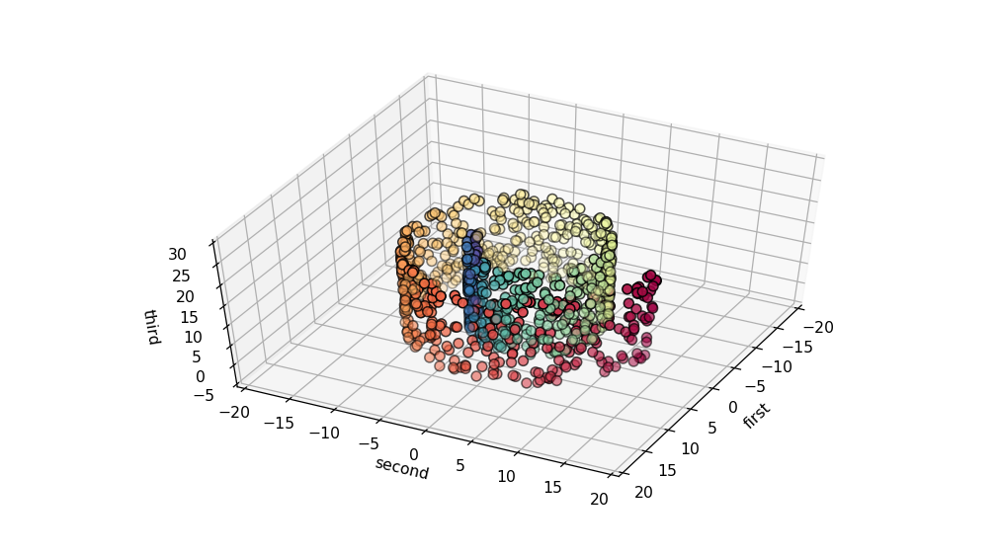

In [3]:
from sklearn import datasets
df_sr, sr_c = datasets.make_swiss_roll(n_samples=1000, noise=0.0, random_state=None)

df_sr = pd.DataFrame(df_sr, columns = ['1st','2nd','3rd'])
df_sr['first']  = df_sr['1st']
df_sr['second'] = df_sr['3rd']
df_sr['third']  = df_sr['2nd']
del df_sr['1st']; del df_sr['2nd']; del df_sr['3rd']

scatter3D(df_sr, return_plot = False, xlim=(-20,20), ylim=(-20,20), zlim=(-5,30), color = sr_c, cmap = plt.cm.Spectral_r, azim = 27, elev = 52)

### Linear and non-linear embeddings of Gaussian random data

Create random vector $\mathbf{y}$ by linear transformation of the Gaussian distributed latent variables. In our example latent varible dimension is $\mathbb{R}^{2}$ and the new transformed vector live in $\mathbb{R}^{3}$.

$$\mathbf{y} = \mathbf{W} \mathbf{x}$$

In [4]:
x_normal = pd.DataFrame()
x_normal['first'] = np.random.normal(0,2, 1000)
x_normal['second'] = np.random.normal(0,1, 1000)

In [5]:
# Linear embedding to 3D space
W = np.matrix('0.2 0.8; 0.4 0.5; 0.7 0.3')
y_1 = pd.DataFrame(np.matmul(x_normal.values,W.T), columns = ['first', 'second','third'])

In [6]:
# Non-linear emebdding of latent variables
y_2 = pd.DataFrame()
y_2['x'] = [4 * math.cos((1/4)*val) for val in x_normal['first']]
y_2['y'] = [4 * math.sin((1/4)*val) for val in x_normal['first']]
y_2['z'] = x_normal['first'] + x_normal['second']

<IPython.core.display.Javascript object>


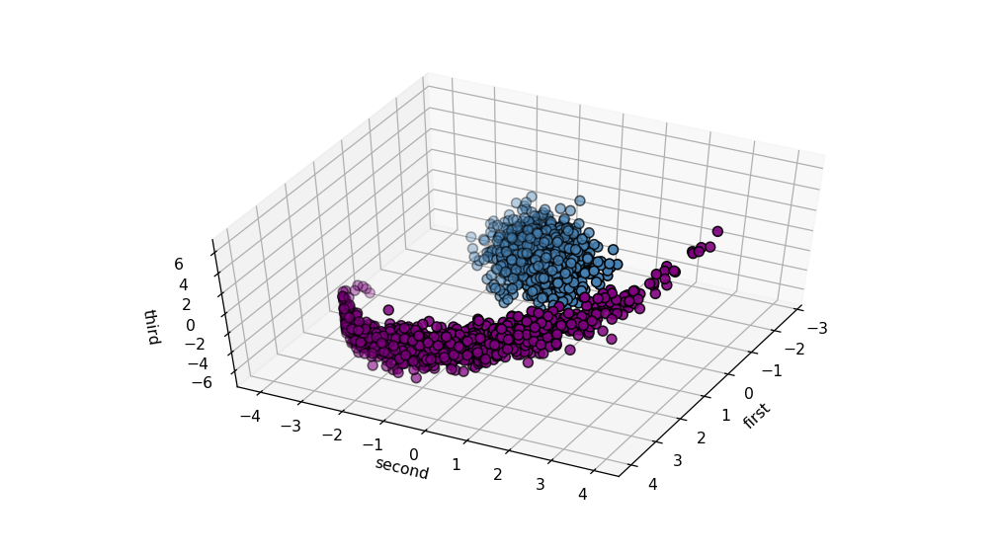

In [7]:
# Plot both 3D embeddings
fig, ax = scatter3D(y_1, return_plot = True, color = "steelblue", azim = 27, elev = 52)
ax.scatter(y_2.iloc[:, 0], y_2.iloc[:, 1], y_2.iloc[:, 2], edgecolor = 'k', s=40, c = "purple")   

### Linear embedding of uniform random data

<IPython.core.display.Javascript object>


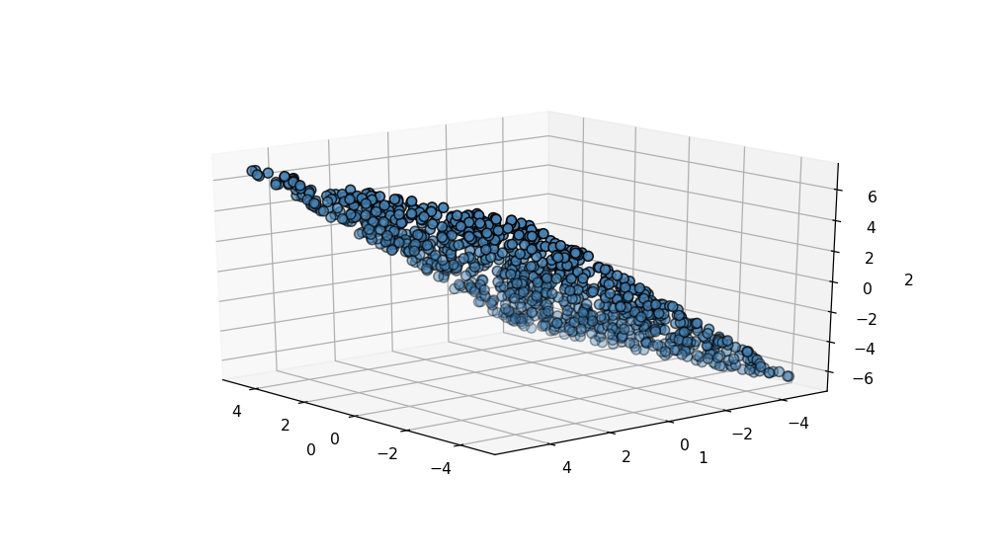

(<matplotlib.figure.Figure at 0x138db5d2be0>,
 <matplotlib.axes._subplots.Axes3DSubplot at 0x138dd6ffba8>)

In [8]:
# Laten variables
a_1 = -8; b_1 = 8
a_2 = -4; b_2 = 4
x_uniform = pd.DataFrame(np.random.rand(1000,2), columns = ['first', 'second'])
x_uniform['first'] = (b_1 - a_1) * x_uniform['first'] + a_1
x_uniform['second'] = (b_2 - a_2) * x_uniform['second'] + a_2

# Linear transformation
W = np.matrix('0.2 0.8; 0.4 0.5; 0.7 0.3')
y_3 = pd.DataFrame(np.matmul(x_uniform.values,W.T))

scatter3D(y_3, azim = 140, elev = 20)

## PCA

To see how well PCA works, we project 3D datasets to $\mathbb{R}^2$.

About PCA results being "flipped", see <a href="https://stackoverflow.com/questions/21115669/scikit-learn-pca-matrix-transformation-produces-pc-estimates-with-flipped-signs">here</a>.

### Linear embedding of Gaussian random data
All in all **PCA does a good job in dimensionality reduction**: Third eigenvalue of the estimated covariance matrix is very close to zero, meaning that the number of latent variable is two. However, the eigenvalues are not that close to ones reported in book at page 33. Since columns of the mixing matrix $W$ are not neither orthogonal nor normed, PCA cannot retrieve exactly the true latent variables. Instead, estimated latent variables are slightly scaled and rotated. **This means that latent variable separation is not perfect**.

<IPython.core.display.Javascript object>


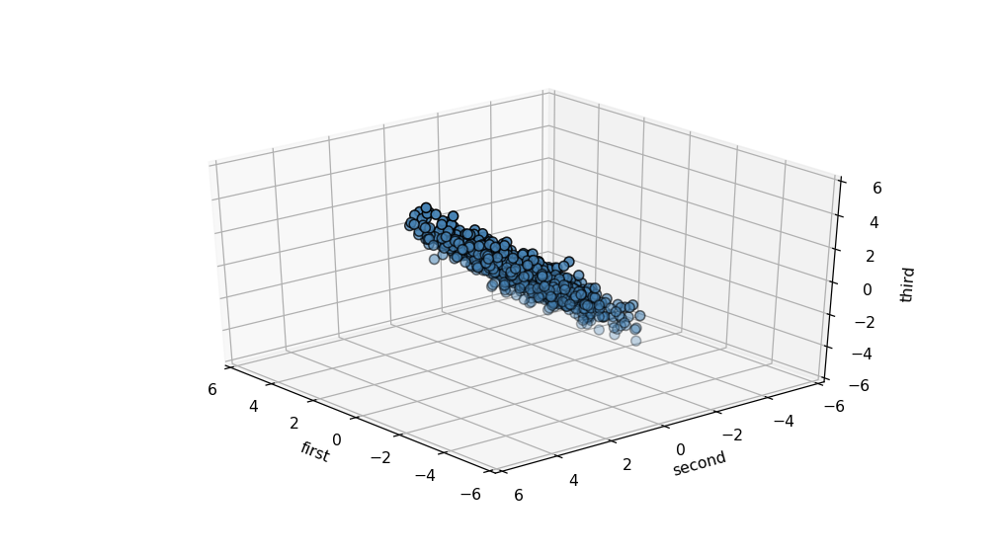

<IPython.core.display.Javascript object>


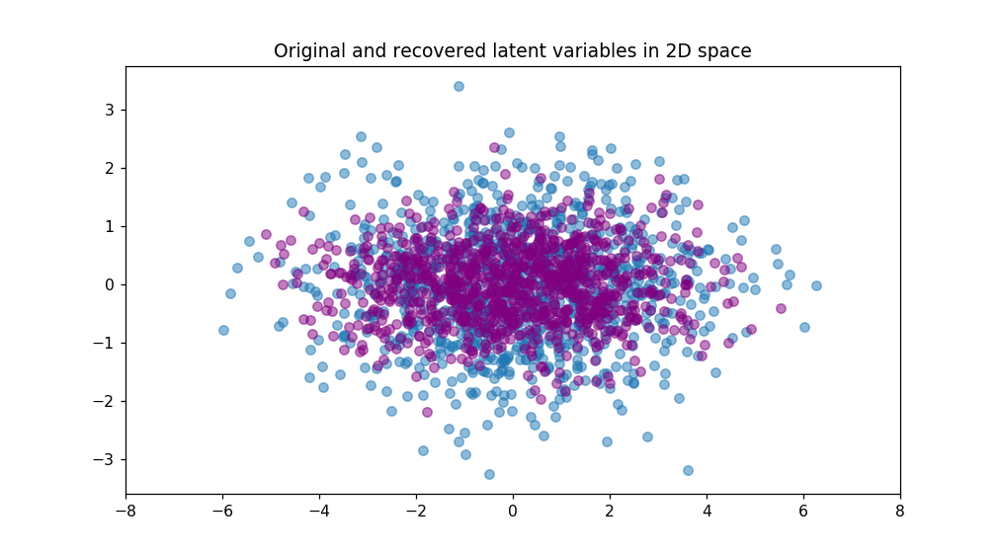

Eigenvalues are: [3.28211618e+00 4.15741318e-01 2.02391415e-15]


In [9]:
# Plot 3D embedding
scatter3D(y_1, azim = 140, elev = 32, xlim=(-6,6),ylim=(-6,6),zlim=(-6,6))

# Use PCA to reduce dimensionality back to 2D space
pca_1 = PCA(n_components = 2, random_state = seed)
pca_1.fit(y_1)
x_pca_1 = pd.DataFrame(pca_1.transform(y_1))
x_pca_1.columns = ['first','second']

# Plot latent variables and recovered ones
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5)
ax.scatter(x = 'first',y = 'second',data = x_pca_1,c = 'purple', alpha = 0.5)
ax.set_title('Original and recovered latent variables in 2D space')
ax.set_xlim(-8,8)

eigvals,_ = np.linalg.eig(pca_1.get_covariance())
print("Eigenvalues are: {}".format(eigvals))


### Non-linear embedding of Gaussian random data
With non-linear embedding PCA fails to detect only two latent variables, which is seen from non-zero eigenvalues of the estimated covarianve matrix. Again the eigenvalues are different than what stated in book page 34. The latent varible separation is also wrong, which is seen from deformed projection.

Notice that PCA loadins are not unique; here we flip 2d PCA results so that the PCA projection looks like in fig. 2.8 in the book.

<IPython.core.display.Javascript object>


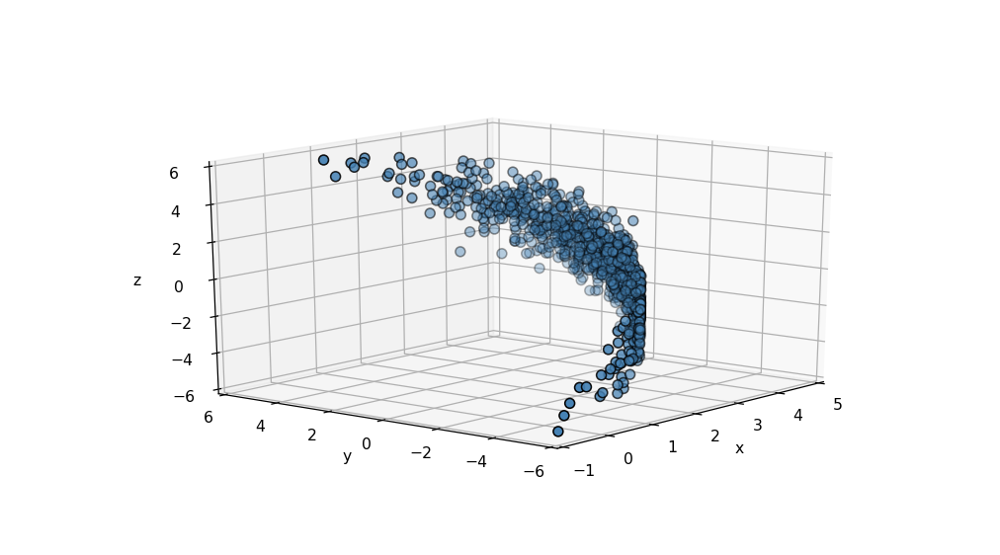

<IPython.core.display.Javascript object>


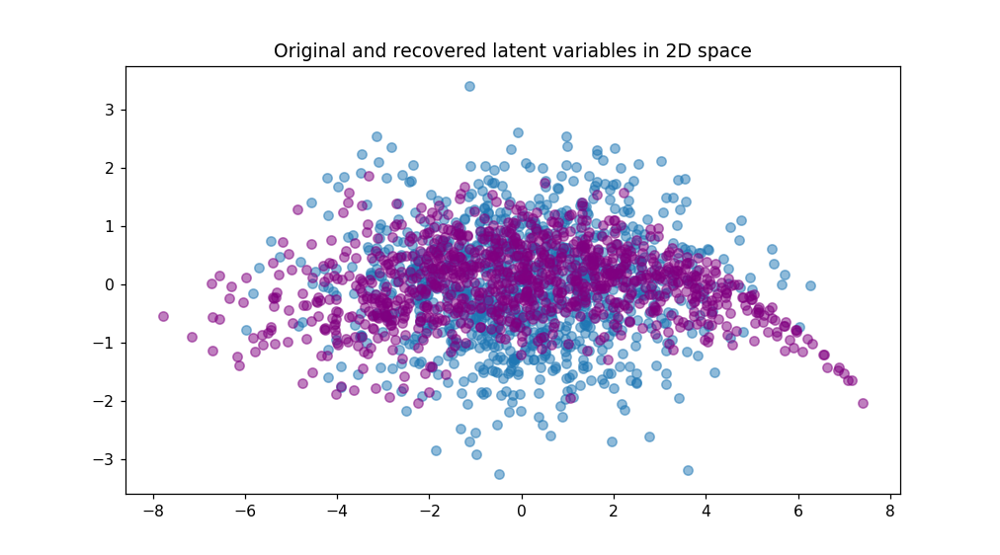

Eigenvalues are: [7.67463956 0.37303604 0.41967848]


In [10]:
# Plot 3D embedding
scatter3D(y_2, azim = -141, elev = 17, xlim=(-1,5),ylim=(-6,6),zlim=(-6,6))

# Use PCA to reduce dimensionality back to 2D space
pca_2 = PCA(n_components = 2, random_state = seed)
pca_2.fit(y_2)
x_pca_2 = pd.DataFrame(pca_2.transform(y_2))
x_pca_2.columns = ['first','second']
x_pca_2['first'] = x_pca_2['first'] * -1
x_pca_2.second = x_pca_2.second * -1 # flip loading sign to produce it like in book

# Plot latent variables and recovered ones
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5)
ax.scatter(x = 'first',y = 'second',data = x_pca_2,c = 'purple', alpha = 0.5)
ax.set_title('Original and recovered latent variables in 2D space')

eigvals,_ = np.linalg.eig(pca_2.get_covariance())
print("Eigenvalues are: {}".format(eigvals))


### Linear embedding of uniform random data
Dimensionality reduction: Performed without a loss (zero 3rd eigenvalue). As in the case of linear embedding of Gaussian random data, estimted latent variables are scaled and rotated (due to $W$). However, since the latent variables have uniform distributions and not Gaussian ones, the scaling and rotations make the estimated latent vaiables no longer uniformly distributed. 

<IPython.core.display.Javascript object>


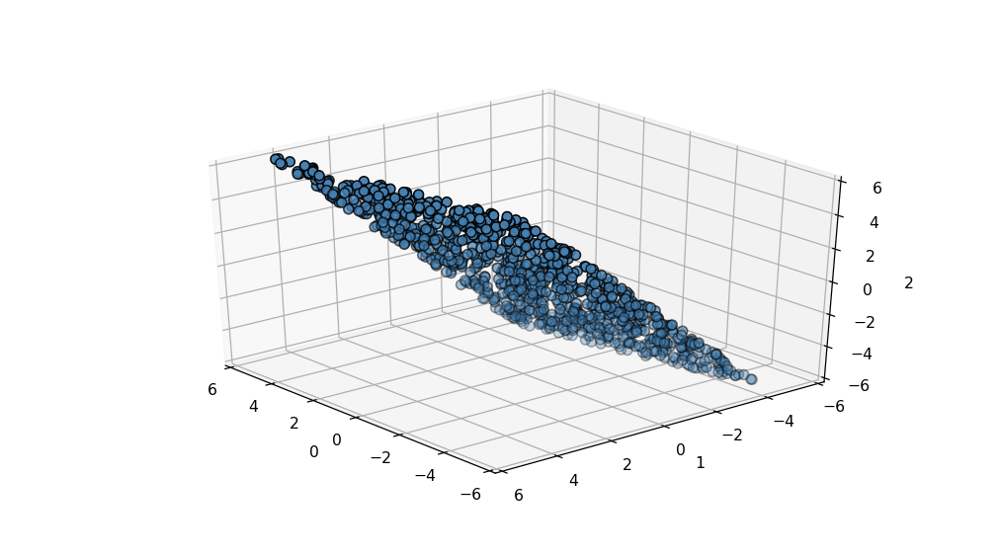

<IPython.core.display.Javascript object>


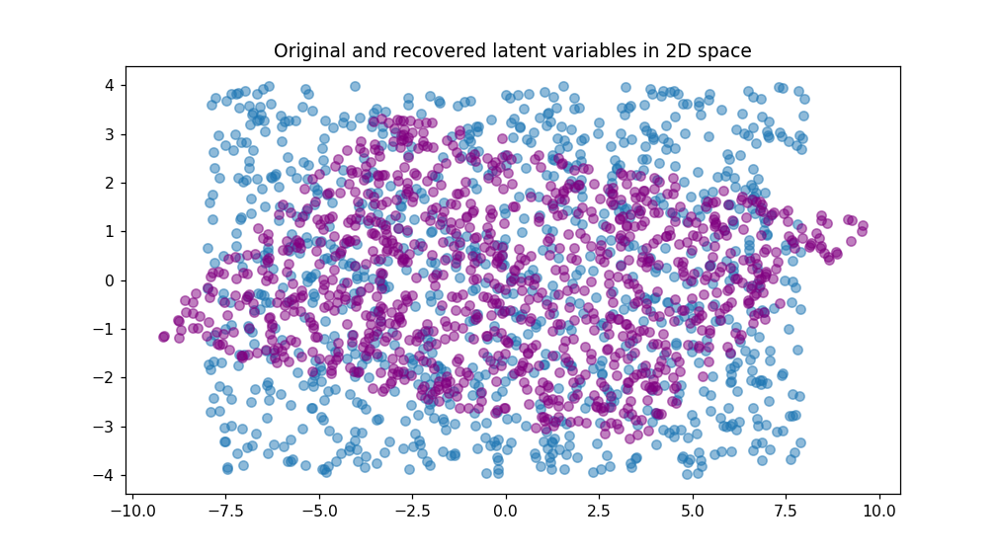

Eigenvalues are: [ 1.77184576e+01  2.29075301e+00 -3.85575534e-15]


In [11]:
# Plot 3D embedding
scatter3D(y_3, azim = 140, elev = 32, xlim=(-6,6),ylim=(-6,6),zlim=(-6,6))

# Use PCA to reduce dimensionality back to 2D space
pca_3 = PCA(n_components = 2, random_state = seed)
pca_3.fit(y_3)
x_pca_3 = pd.DataFrame(pca_3.transform(y_3))
x_pca_3.columns = ['first','second']

# Plot latent variables and recovered ones
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_uniform, alpha = 0.5)
ax.scatter(x = 'first',y = 'second',data = x_pca_3,c = 'purple', alpha = 0.5)
ax.set_title('Original and recovered latent variables in 2D space')

eigvals,_ = np.linalg.eig(pca_3.get_covariance())
print("Eigenvalues are: {}".format(eigvals))


### Swiss roll

<IPython.core.display.Javascript object>


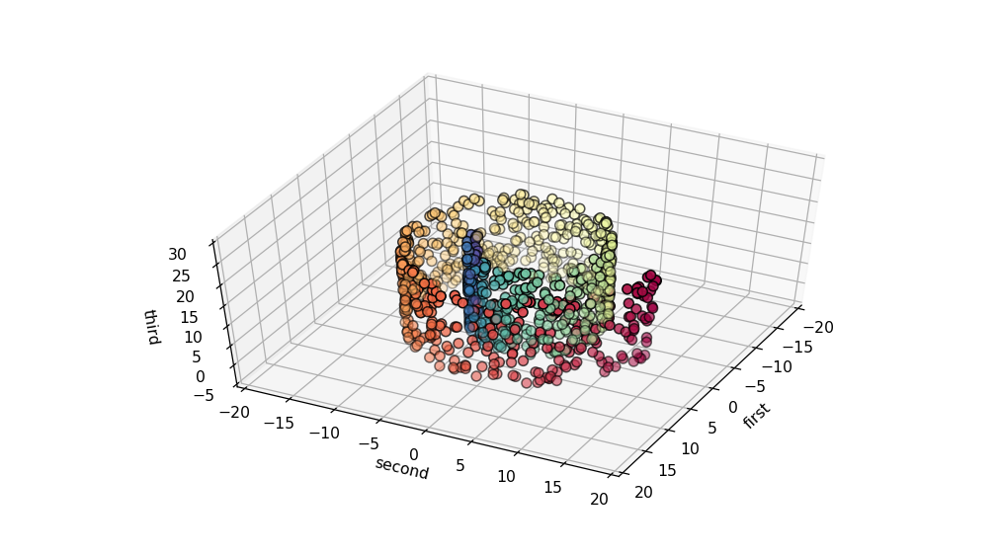

<IPython.core.display.Javascript object>


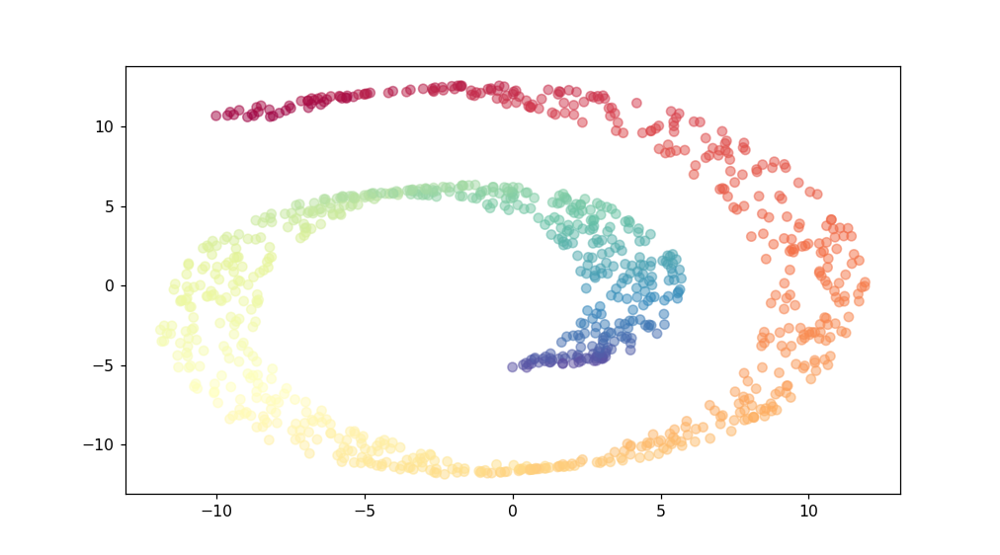

Eigenvalues are: [50.88631218 41.84256763 37.81092484]


In [12]:
# Plot 3D embedding
scatter3D(df_sr, return_plot = False, xlim=(-20,20), ylim=(-20,20), zlim=(-5,30), color = sr_c, cmap = plt.cm.Spectral_r, azim = 27, elev = 52)

# Use PCA to reduce dimensionality back to 2D space
pca_4 = PCA(n_components = 2, random_state = seed)
pca_4.fit(df_sr)
x_pca_4 = pd.DataFrame(pca_4.transform(df_sr))
x_pca_4.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'second',y = 'first',data = x_pca_4,c=sr_c,cmap = plt.cm.Spectral_r, alpha = 0.5)
ax.set_title('')

eigvals,_ = np.linalg.eig(pca_4.get_covariance())
print("Eigenvalues are: {}".format(eigvals))


## Classical (Torgerson's) metric MDS
Link <a href="https://stats.stackexchange.com/questions/14002/whats-the-difference-between-principal-component-analysis-and-multidimensional/14013">here</a> on what is the differece between metric MDS and PCA. "So, PCA might be called the algorithm of the simplest MDS [cmMDS]." So it seems there i no difference between PCA and cmMDS as far as dimension reduction results go!

The implementation for classical metric MDS (cmMDS) that I found is from <a href="http://www.nervouscomputer.com/hfs/cmdscale-in-python/">here</a>.

Not totally sure how we obtain the Gram matrix here, or I do not see how it is equivalent to 4.20 in Nonlinear Dimensionality Reduction (Lee & Verleysen 2007).

Scikit learn MDS implements either mMDS or nMDS using SMACOF algorithm. It cannot perform the classical metric MDS. I think the scikit learn PCA is not the same closed-form version that is equivalent to cMDS, since it is implemented through a probabilistic algortihm. So results from scikit learn's PCA most probably might not be exactly the same as with cMDS here, but the results seem to be exact match!

In [13]:
def cmdscale(Y, dim):
    """                                                                                       
    Classical multidimensional scaling (MDS)
    as presented in section 4.2.2 of Lee & Verleysen 
    (2007): Nonlinear Dimensionality Reduction. See Fig 4.1.
    
    Inspired by
    http://www.nervouscomputer.com/hfs/cmdscale-in-python/

    By Ville Voutilainen.
    License: MIT.

    Dependencies                                                                                
    ---------- 
    import numpy as np
    
    from sklearn.metrics import euclidean_distances
     -> To calculate pairwise distances of input data

    Parameters                                                                                
    ----------                                                                                
    Y  : (N, D) pandas data frame                                                                          
         N observations and D features. 
         
    dim: Number of dimensionality to be reduced to.
                                                                                               
    Returns                                                                                   
    -------                                                                                   
    X_hat : (N, dim) array                                                                          
            Estimated latent variables with dim dimensions. dim 
            corresponds to biggest dim eigenvalues of S.                 
            Note that each dimension is only determined up to an                    
            overall sign, corresponding to a reflection.                                                        
                                                                                               
    evals : (n,) array                                                                            
        All positive eigenvalues of S.                                                                     
                                                                                               
    """
    from sklearn.metrics import euclidean_distances
    
    # Y as numpy array
    Y = Y.values
    
    # Center Y values
    mean = Y.mean(axis=0)
    Y = Y - mean[np.newaxis,:]    
    
    # Transpose Y to be (D,N) array
    Y = Y.T
    
    # Gram's matrix (eq. 4.23)
    S = np.dot(Y.T,Y)
 
    # Get eigenvalue decomposition (eq. 4.27)                                                                            
    evals, evecs = np.linalg.eigh(S)
 
    # Sort by eigenvalue in descending order                                                  
    idx   = np.argsort(evals)[::-1]
    evals = evals[idx]
    evecs = evecs[:,idx]
 
    ## Compute the coordinates using positive-eigenvalued components only                      
    w,    = np.where(evals > 0)
    L     = np.diag(np.sqrt(evals[w]))
    U     = evecs[:,w]
    X_hat = L.dot(U.T) # eq. 4.30 without multiplying with I
    X_hat = X_hat[0:dim,:].T # eq. 4.30 multiplying by I
    
    return X_hat, evals

### Linear embedding of Gaussian random data

<IPython.core.display.Javascript object>


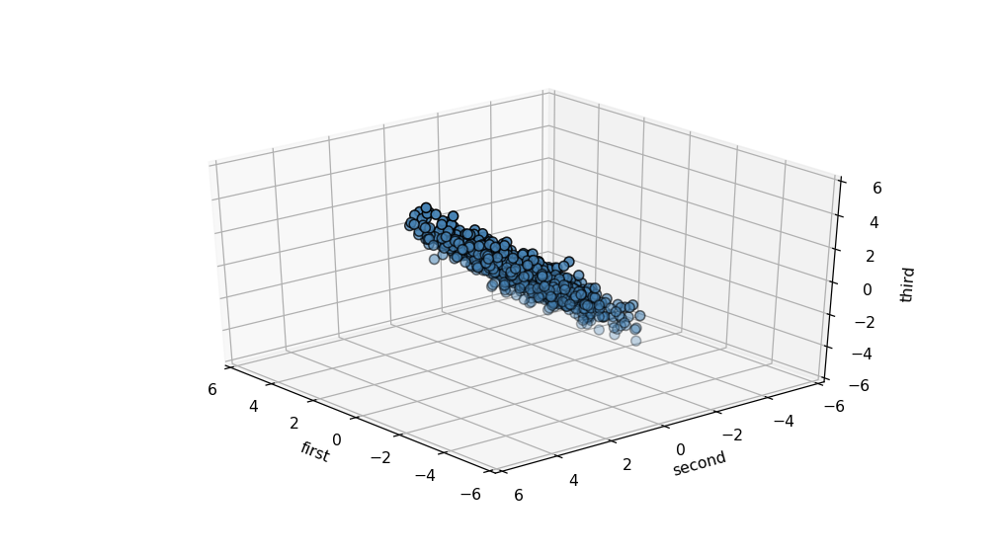

<IPython.core.display.Javascript object>


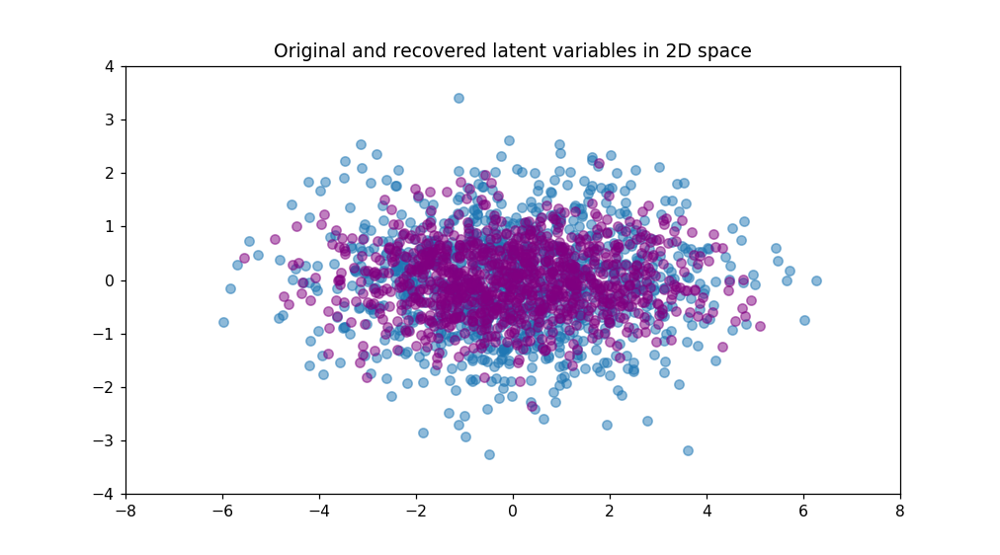

<IPython.core.display.Javascript object>


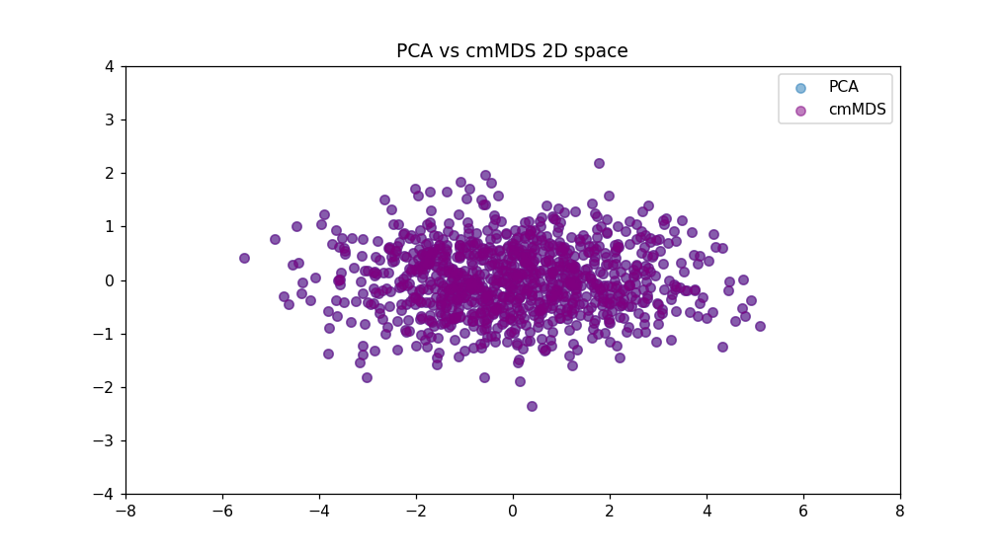

In [14]:
# Plot 3D embedding
scatter3D(y_1, azim = 140, elev = 32, xlim=(-6,6),ylim=(-6,6),zlim=(-6,6))

cmmds_1, cmmds_1_evals = cmdscale(y_1,dim=2)
cmmds_1 = pd.DataFrame(cmmds_1)
cmmds_1.columns = ['first','second']

# Plot latent variables and recovered ones
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5)
ax.scatter(x = 'first',y = 'second',data = cmmds_1,c = 'purple', alpha = 0.5)
ax.set_title('Original and recovered latent variables in 2D space')
ax.set_xlim(-8,8)
ax.set_ylim(-4,4)

# Plot ccmds vs pca
x_pca_1_temp = x_pca_1.copy()
x_pca_1_temp['first'] = x_pca_1_temp['first'] * -1 # flip loading
x_pca_1_temp['second'] = x_pca_1_temp['second'] * -1 # flip loading
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_pca_1_temp, alpha = 0.5, label="PCA")
ax.scatter(x = 'first',y = 'second',data = cmmds_1,c = 'purple', alpha = 0.5, label="cmMDS")
ax.set_title('PCA vs cmMDS 2D space')
ax.set_xlim(-8,8)
ax.set_ylim(-4,4)
ax.legend()

### Non-linear embedding of Gaussian random data

<IPython.core.display.Javascript object>


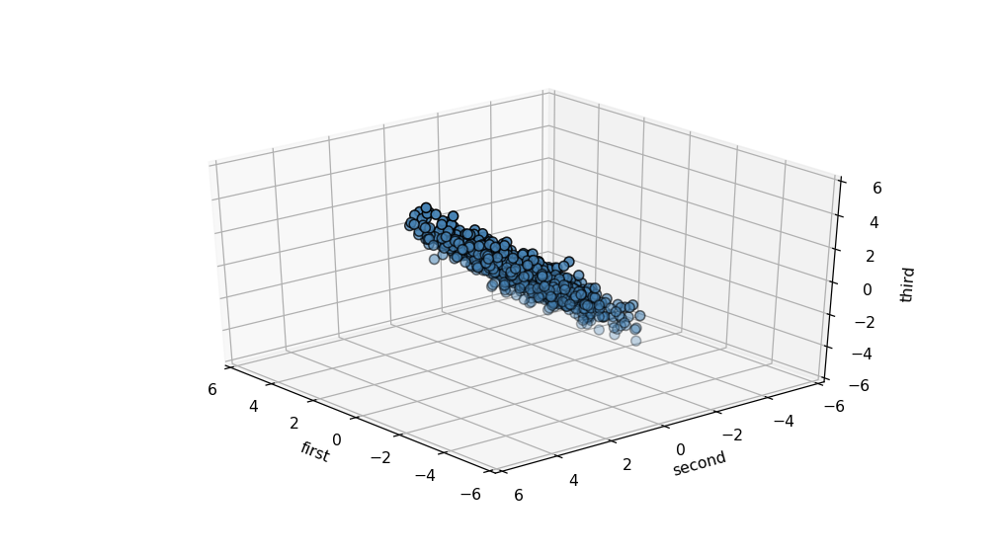

<IPython.core.display.Javascript object>


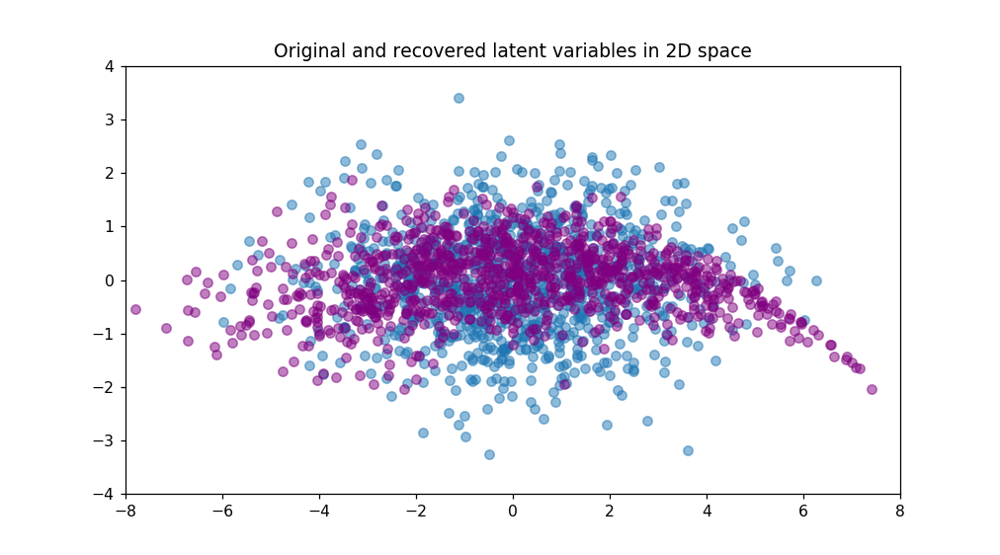

<IPython.core.display.Javascript object>


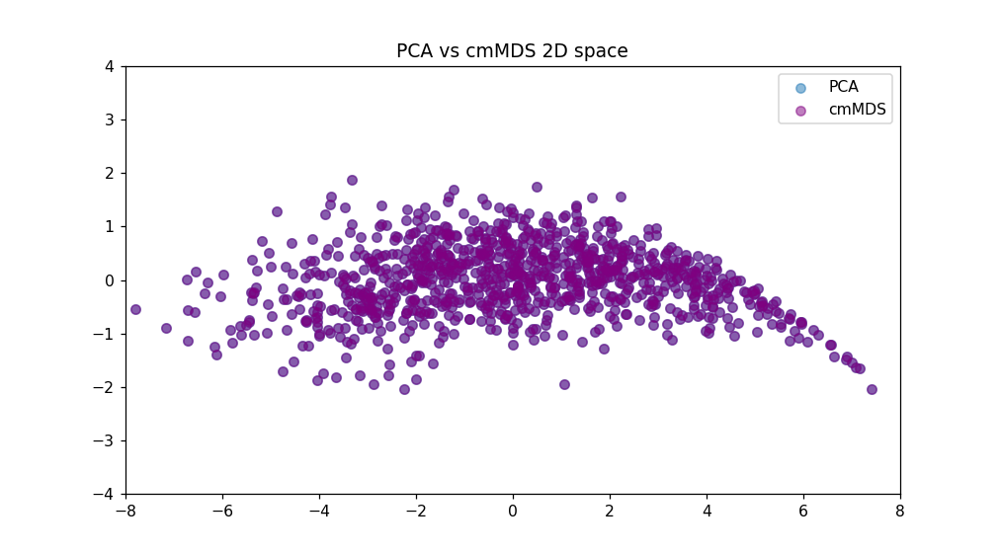

In [15]:
# Plot 3D embedding
scatter3D(y_1, azim = 140, elev = 32, xlim=(-6,6),ylim=(-6,6),zlim=(-6,6))

cmmds_2, cmmds_2_evals = cmdscale(y_2,dim=2)
cmmds_2 = pd.DataFrame(cmmds_2)
cmmds_2.columns = ['first','second']

# Plot latent variables and recovered ones
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5)
ax.scatter(x = 'first',y = 'second',data = cmmds_2,c = 'purple', alpha = 0.5)
ax.set_title('Original and recovered latent variables in 2D space')
ax.set_xlim(-8,8)
ax.set_ylim(-4,4)

# Plot ccmds vs pca
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_pca_2, alpha = 0.5, label="PCA")
ax.scatter(x = 'first',y = 'second',data = cmmds_2,c = 'purple', alpha = 0.5, label="cmMDS")
ax.set_title('PCA vs cmMDS 2D space')
ax.set_xlim(-8,8)
ax.set_ylim(-4,4)
ax.legend()

### Linear embedding of uniform random data

<IPython.core.display.Javascript object>


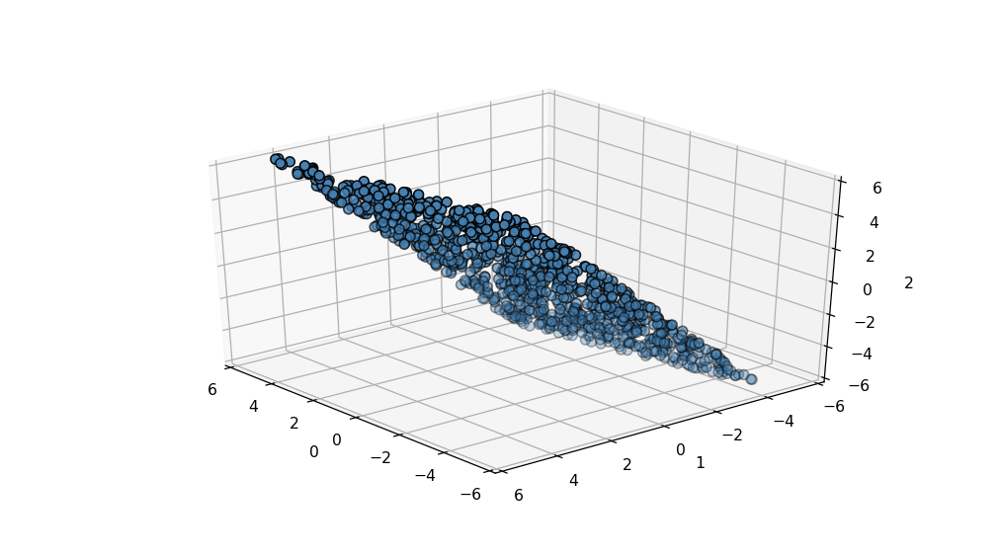

<IPython.core.display.Javascript object>


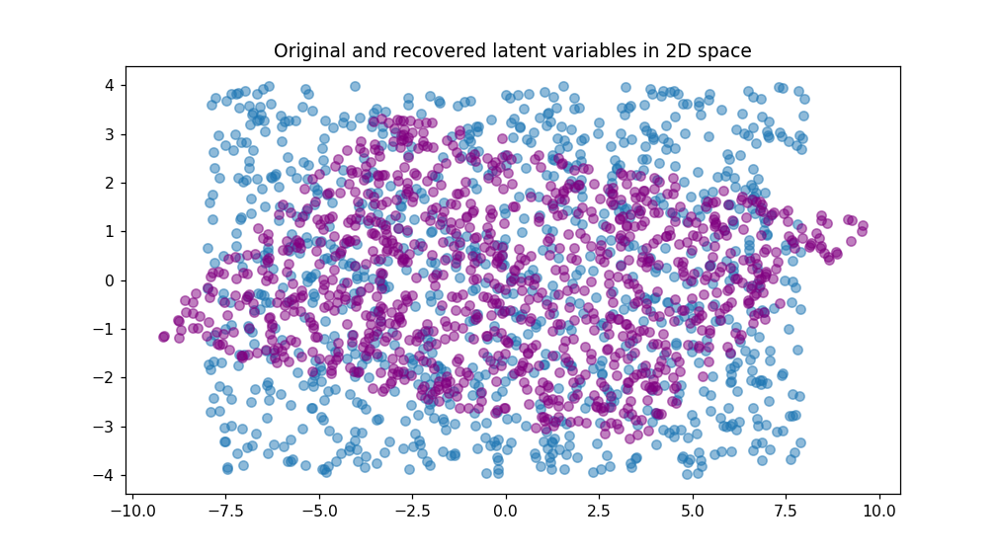

In [16]:
# Plot 3D embedding
scatter3D(y_3, azim = 140, elev = 32, xlim=(-6,6),ylim=(-6,6),zlim=(-6,6))

cmmds_3, cmmds_3_evals = cmdscale(y_3,dim=2)
cmmds_3 = pd.DataFrame(cmmds_3)
cmmds_3.columns = ['first','second']

# Plot latent variables and recovered ones
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_uniform, alpha = 0.5)
ax.scatter(x = 'first',y = 'second',data = cmmds_3,c = 'purple', alpha = 0.5)
ax.set_title('Original and recovered latent variables in 2D space')

### Swiss roll

<IPython.core.display.Javascript object>


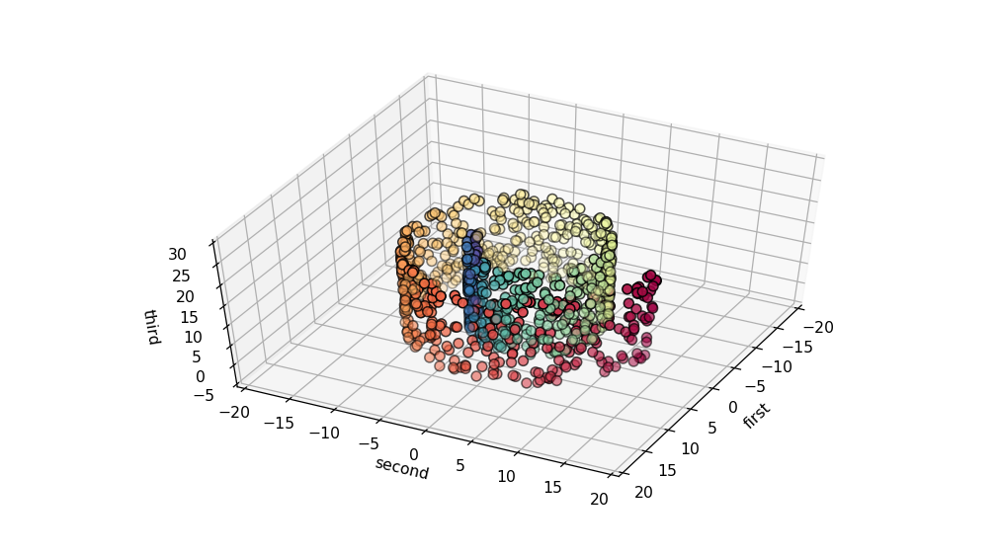

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


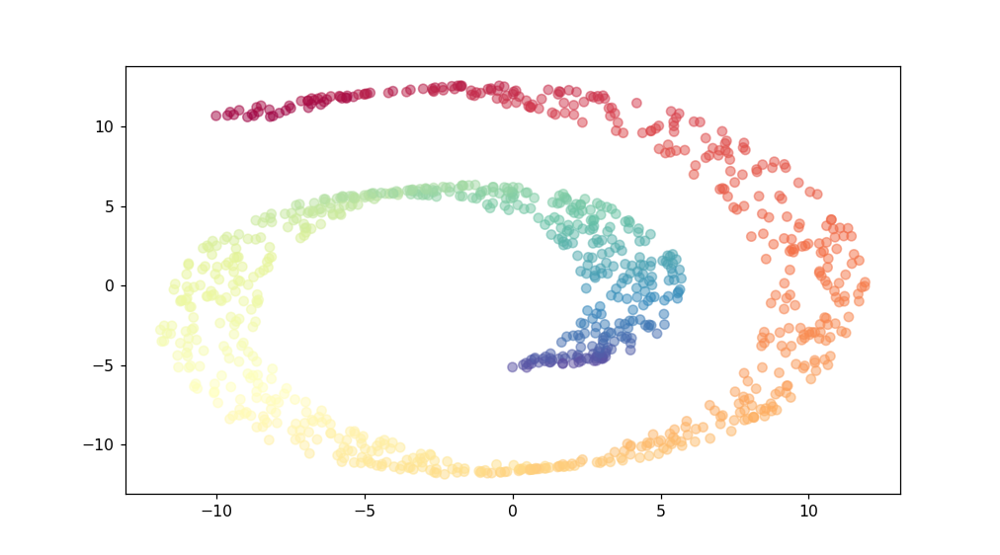

<IPython.core.display.Javascript object>


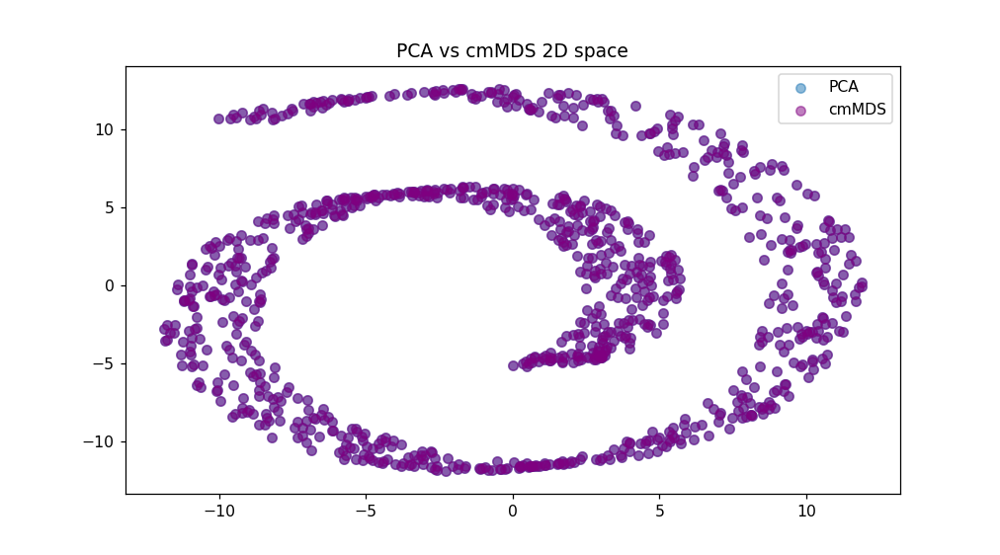

In [17]:
# Plot 3D embedding
scatter3D(df_sr, return_plot = False, xlim=(-20,20), ylim=(-20,20), zlim=(-5,30), color = sr_c, cmap = plt.cm.Spectral_r, azim = 27, elev = 52)

cmmds_4, cmmds_4_evals = cmdscale(df_sr,dim=2)
cmmds_4 = pd.DataFrame(cmmds_4)
cmmds_4.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'second',y = 'first',data = cmmds_4,c=sr_c,cmap = plt.cm.Spectral_r, alpha = 0.5)
ax.set_title('')

# Plot ccmds vs pca
x_pca_4_temp = x_pca_4.copy()
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'second',y = 'first',data = x_pca_4_temp, alpha = 0.5, label="PCA")
ax.scatter(x = 'second',y = 'first',data = cmmds_4,c = 'purple', alpha = 0.5, label="cmMDS")
ax.set_title('PCA vs cmMDS 2D space')
ax.legend()


## mMDS

### Linear embedding of Gaussian random data

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


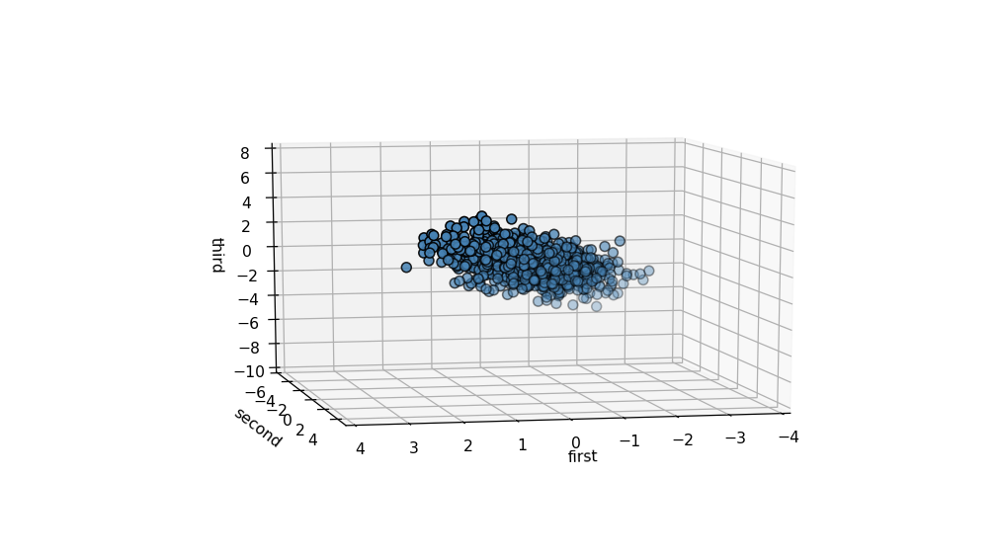

<IPython.core.display.Javascript object>


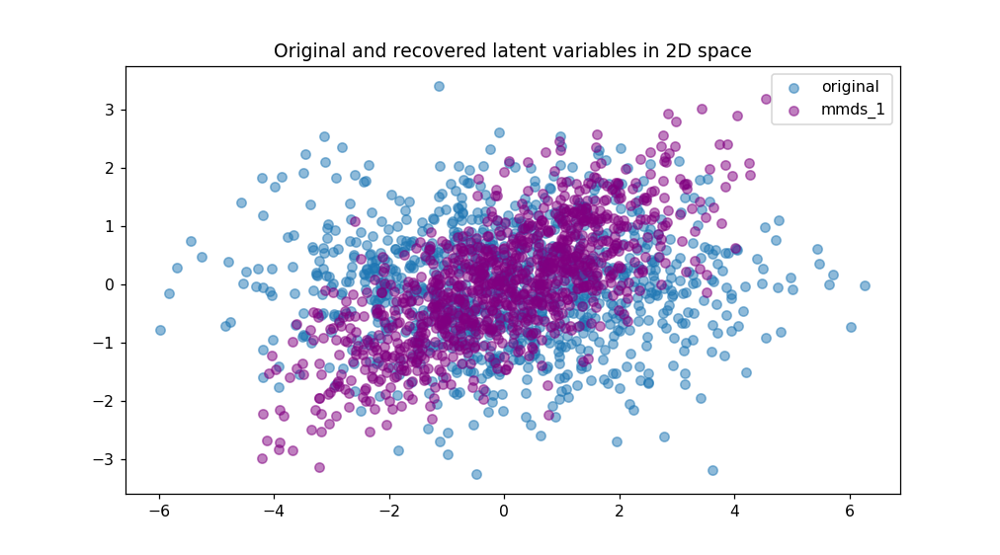

In [18]:
from sklearn import manifold


scatter3D(y_1, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

mmds_1 = manifold.MDS(n_components=2,dissimilarity="euclidean", n_jobs=1,random_state=seed)
x_mmds_1 = pd.DataFrame(mmds_1.fit_transform(y_1))
x_mmds_1.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5, label = 'original')
ax.scatter(x = 'first',y = 'second',data = x_mmds_1,c = 'purple', alpha = 0.5, label = 'mmds_1')
ax.set_title('Original and recovered latent variables in 2D space')
ax.legend()


### Non-linear embedding of Gaussian random data

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


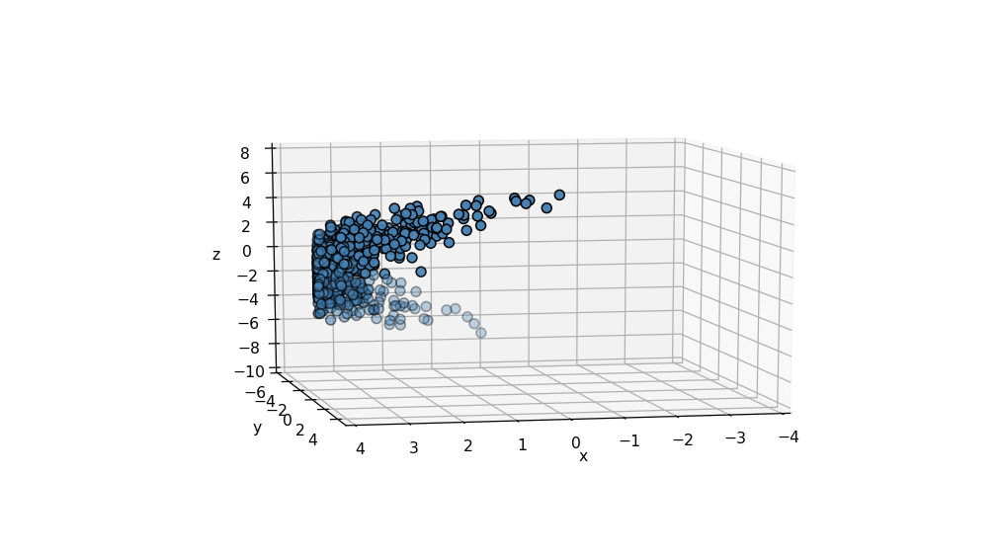

<IPython.core.display.Javascript object>


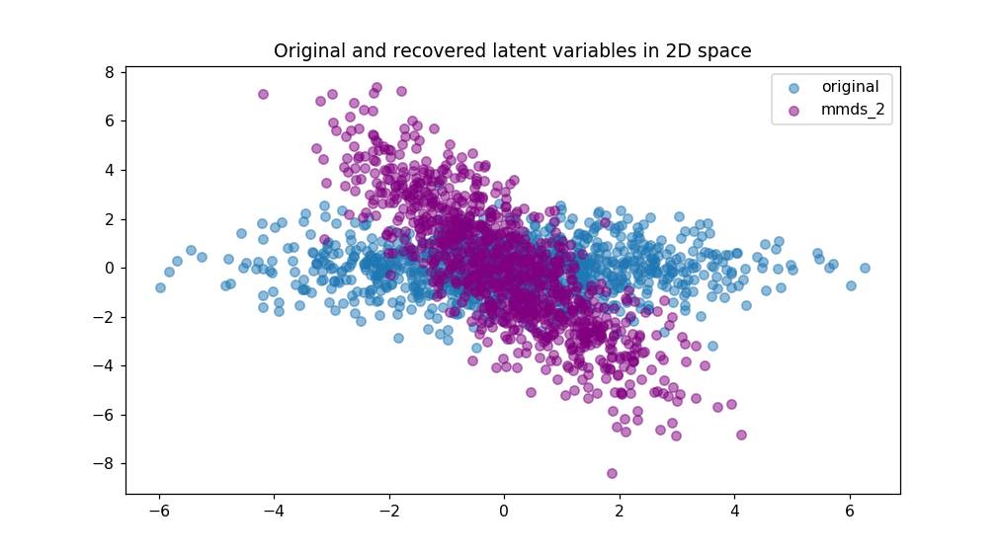

In [19]:
from sklearn import manifold

scatter3D(y_2, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

mmds_2 = manifold.MDS(n_components=2,dissimilarity="euclidean", n_jobs=1,random_state=seed)
x_mmds_2 = pd.DataFrame(mmds_2.fit_transform(y_2))
x_mmds_2.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5, label = 'original')
ax.scatter(x = 'first',y = 'second',data = x_mmds_2,c = 'purple', alpha = 0.5, label = 'mmds_2')
ax.set_title('Original and recovered latent variables in 2D space')
ax.legend()


### Linear embedding of uniform random data

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


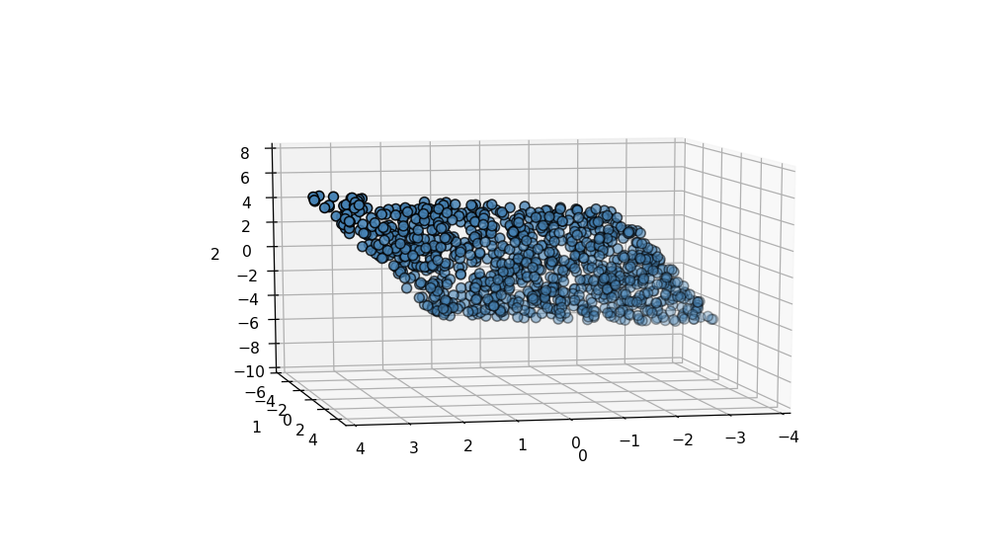

<IPython.core.display.Javascript object>


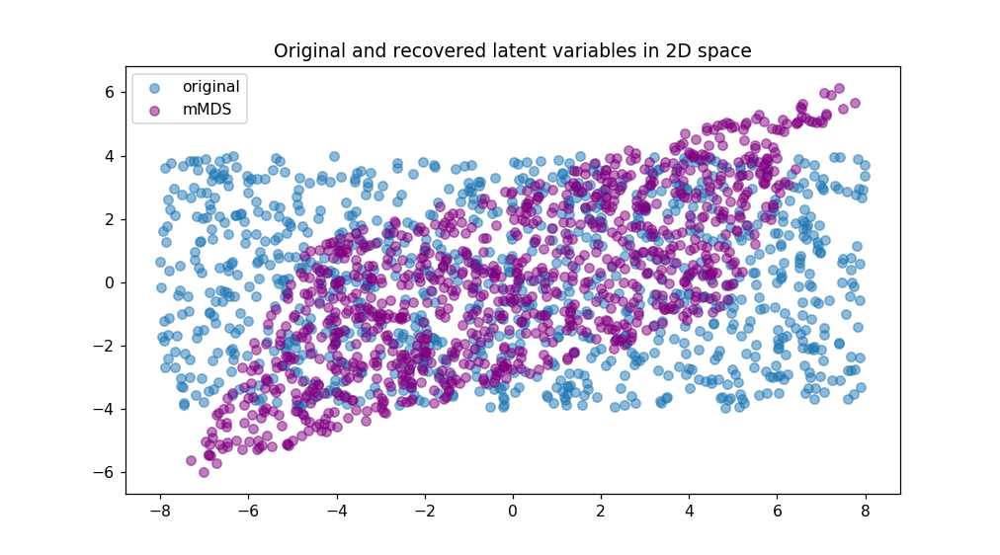

In [20]:
scatter3D(y_3, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

mmds_3 = manifold.MDS(n_components=2,dissimilarity="euclidean", n_jobs=1,random_state=seed)
x_mmds_3 = pd.DataFrame(mmds_3.fit_transform(y_3))
x_mmds_3.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_uniform, alpha = 0.5, label = 'original')
ax.scatter(x = 'first',y = 'second',data = x_mmds_3,c = 'purple', alpha = 0.5, label = 'mMDS')
ax.set_title('Original and recovered latent variables in 2D space')
ax.legend()


### Swiss roll

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


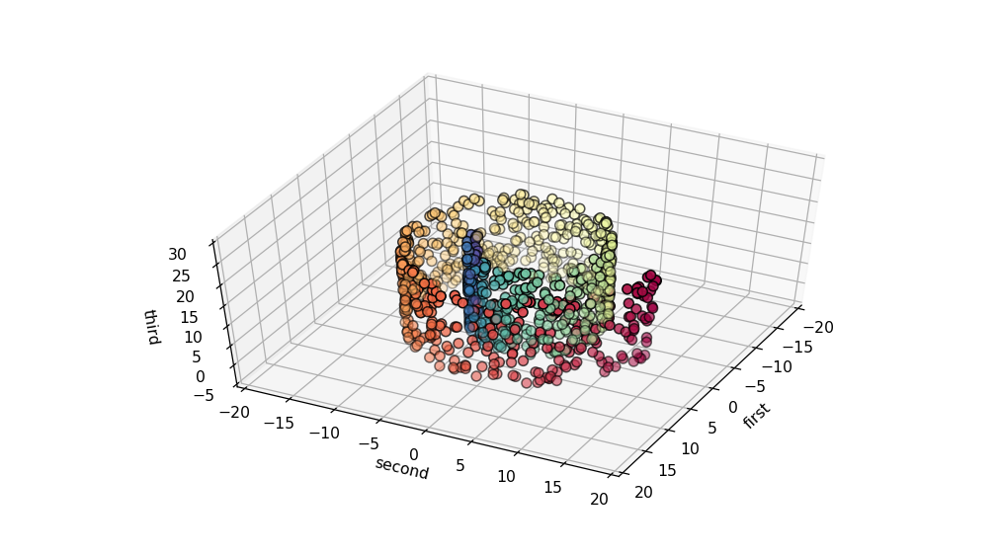

<IPython.core.display.Javascript object>


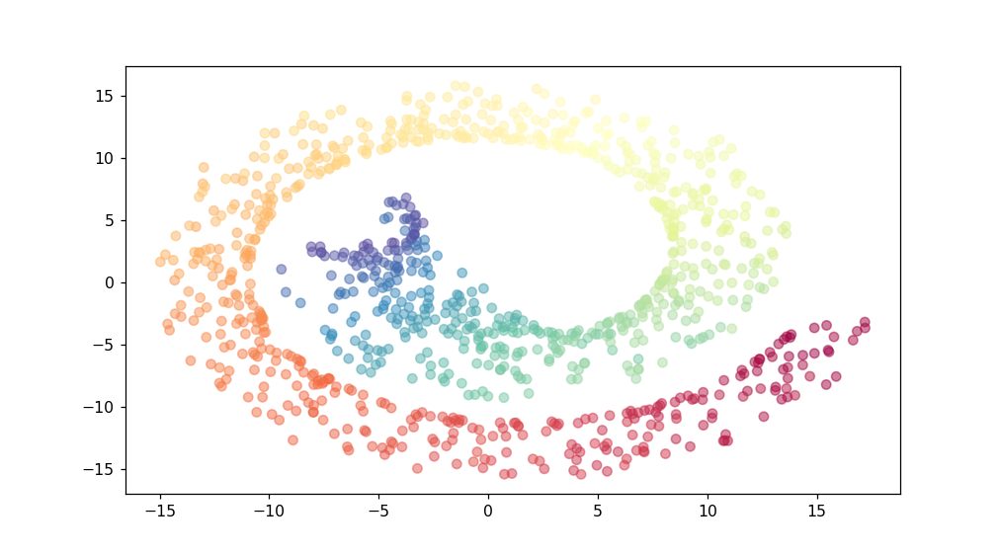

In [21]:
# Plot 3D embedding
scatter3D(df_sr, return_plot = False, xlim=(-20,20), ylim=(-20,20), zlim=(-5,30), color = sr_c, cmap = plt.cm.Spectral_r, azim = 27, elev = 52)

mmds_3 = manifold.MDS(n_components=2,dissimilarity="euclidean", n_jobs=1,random_state=seed)
x_mmds_3 = pd.DataFrame(mmds_3.fit_transform(df_sr))
x_mmds_3.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'second',y = 'first',data = x_mmds_3,c=sr_c,cmap = plt.cm.Spectral_r, alpha = 0.5)
ax.set_title('')


## nMDS

### Linear embedding of Gaussian random data

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


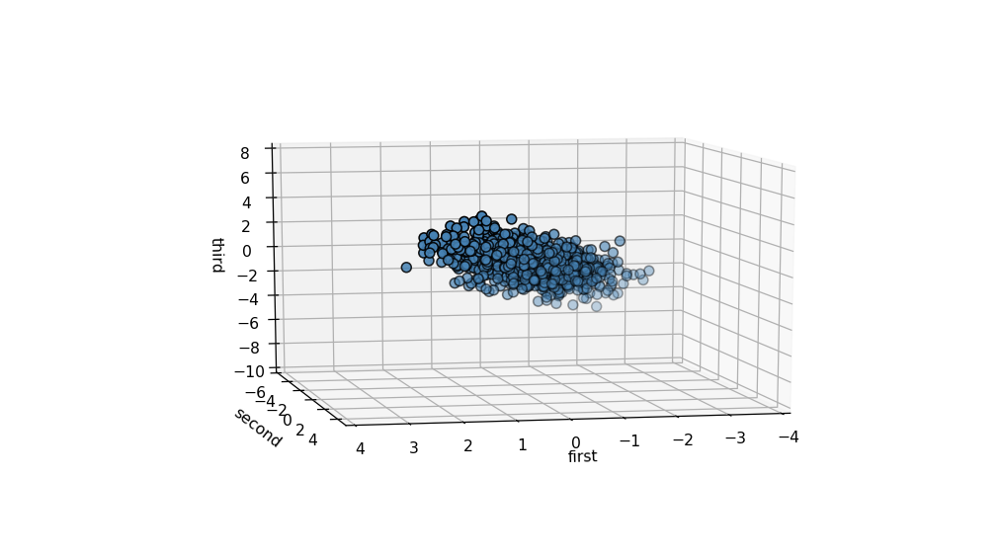

<IPython.core.display.Javascript object>


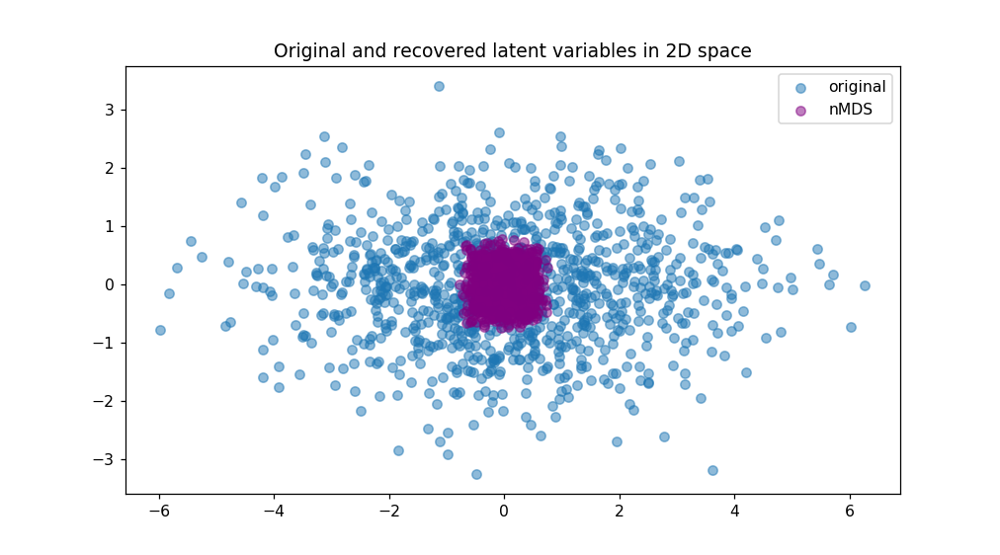

In [22]:
from sklearn import manifold

# Divide embedding space values with std
#from sklearn.preprocessing import scale
#y = pd.DataFrame(scale(y_1, axis=0,with_mean=False,with_std=True))

# PLot embedding in space
scatter3D(y_1, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

nmds = manifold.MDS(n_components=2,dissimilarity="euclidean",metric=False,n_jobs=1,random_state=seed)
x_nmds_1 = pd.DataFrame(nmds.fit_transform(y_1))
x_nmds_1.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5, label = 'original')
ax.scatter(x = 'first',y = 'second',data = x_nmds_1,c = 'purple', alpha = 0.5, label = 'nMDS')
ax.set_title('Original and recovered latent variables in 2D space')
ax.legend()


### Non-linear embedding of Gaussian random data

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


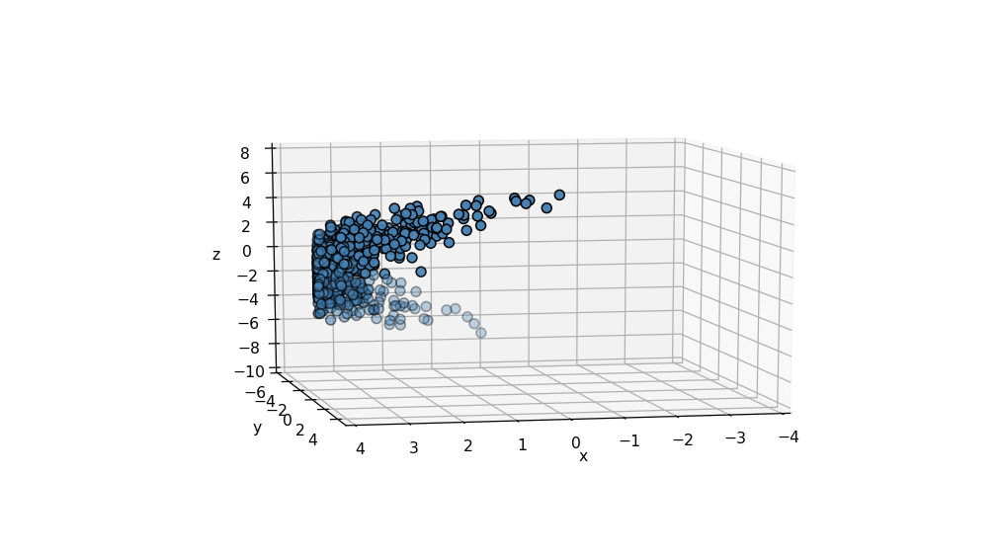

<IPython.core.display.Javascript object>


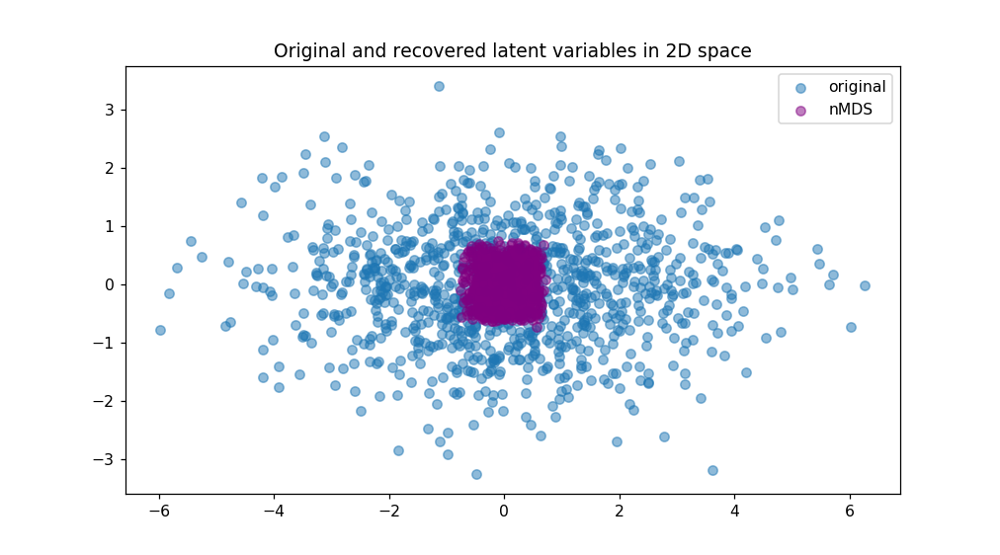

In [23]:
from sklearn import manifold

# PLot embedding in space
scatter3D(y_2, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

nmds_2 = manifold.MDS(n_components=2,dissimilarity="euclidean",metric=False,n_jobs=1,random_state=seed)
x_nmds_2 = pd.DataFrame(nmds_2.fit_transform(y_2))
x_nmds_2.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5, label = 'original')
ax.scatter(x = 'first',y = 'second',data = x_nmds_2,c = 'purple', alpha = 0.5, label = 'nMDS')
ax.set_title('Original and recovered latent variables in 2D space')
ax.legend()


### Linear embedding of uniform random data

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


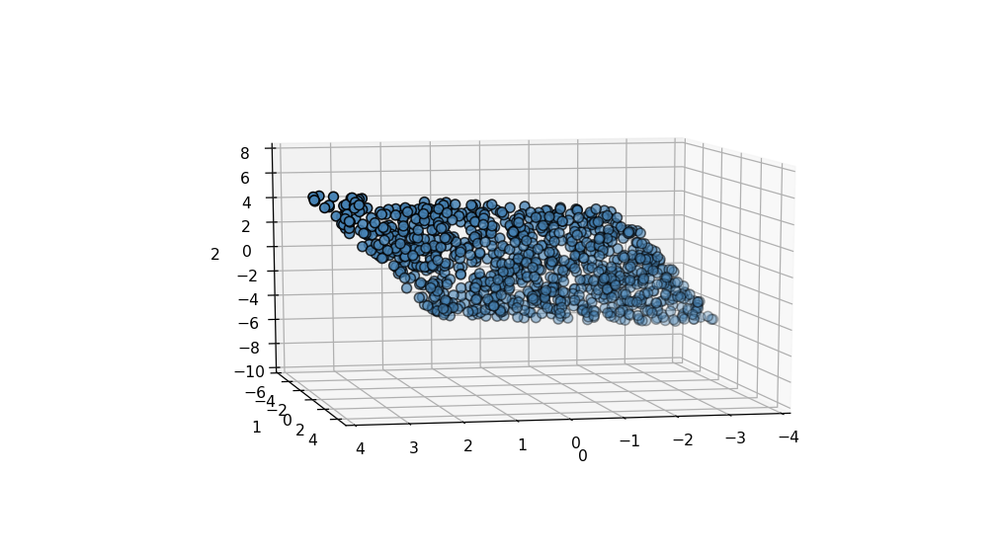

<IPython.core.display.Javascript object>


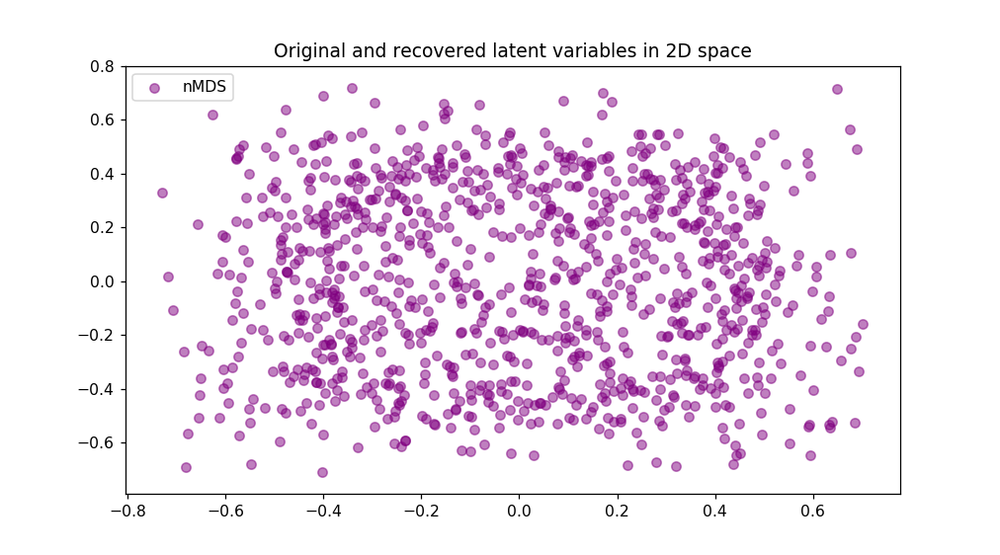

In [24]:
# PLot embedding in space
scatter3D(y_3, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

nmds_3 = manifold.MDS(n_components=2,dissimilarity="euclidean",metric=False,n_jobs=1,random_state=seed)
x_nmds_3 = pd.DataFrame(nmds_3.fit_transform(y_3))
x_nmds_3.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
#ax.scatter(x = 'first',y = 'second',data = x_uniform, alpha = 0.5, label = 'original')
ax.scatter(x = 'first',y = 'second',data = x_nmds_3,c = 'purple', alpha = 0.5, label = 'nMDS')
ax.set_title('Original and recovered latent variables in 2D space')
ax.legend()


### Swiss roll

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


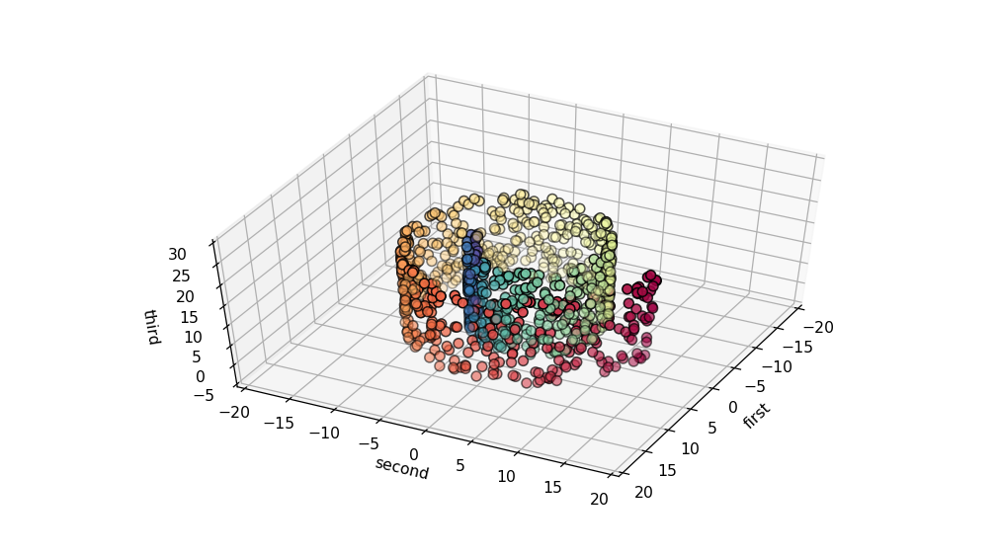

<IPython.core.display.Javascript object>


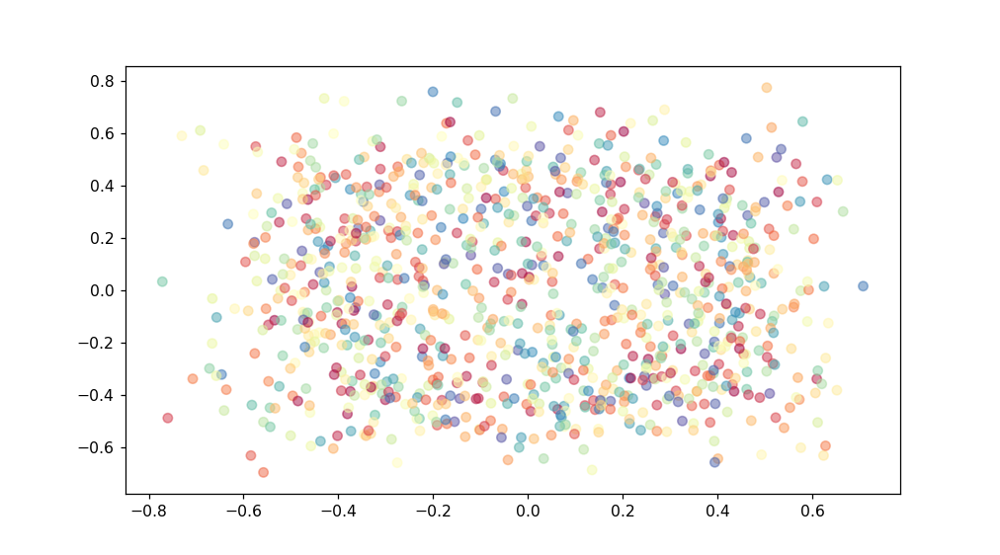

In [25]:
# Plot 3D embedding
scatter3D(df_sr, return_plot = False, xlim=(-20,20), ylim=(-20,20), zlim=(-5,30), color = sr_c, cmap = plt.cm.Spectral_r, azim = 27, elev = 52)

nmds_4 = manifold.MDS(n_components=2,dissimilarity="euclidean",metric=False,n_jobs=1,random_state=seed)
x_nmds_4 = pd.DataFrame(nmds_4.fit_transform(df_sr))
x_nmds_4.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'second',y = 'first',data = x_nmds_4,c=sr_c,cmap = plt.cm.Spectral_r, alpha = 0.5)
ax.set_title('')


## Isomap

### Linear embedding of Gaussian random data

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


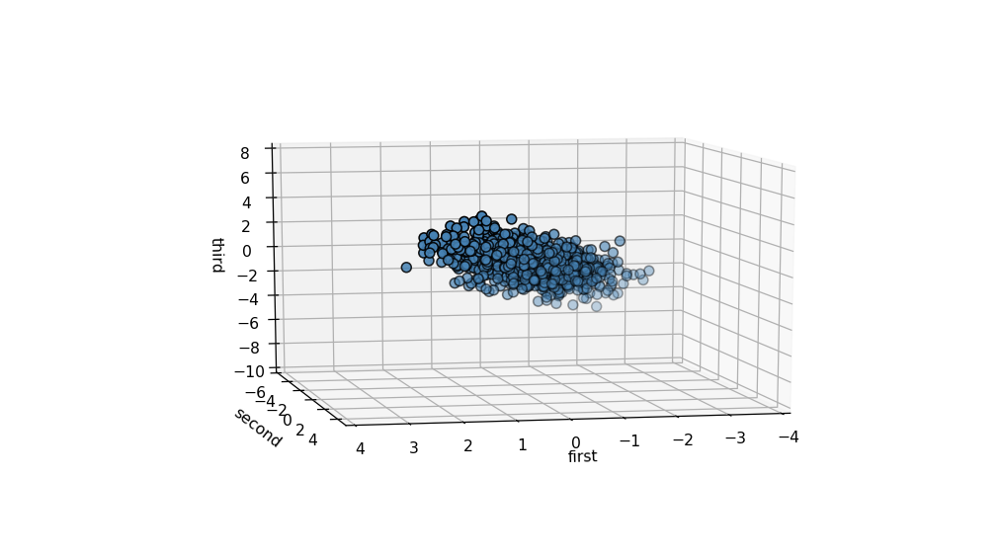

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


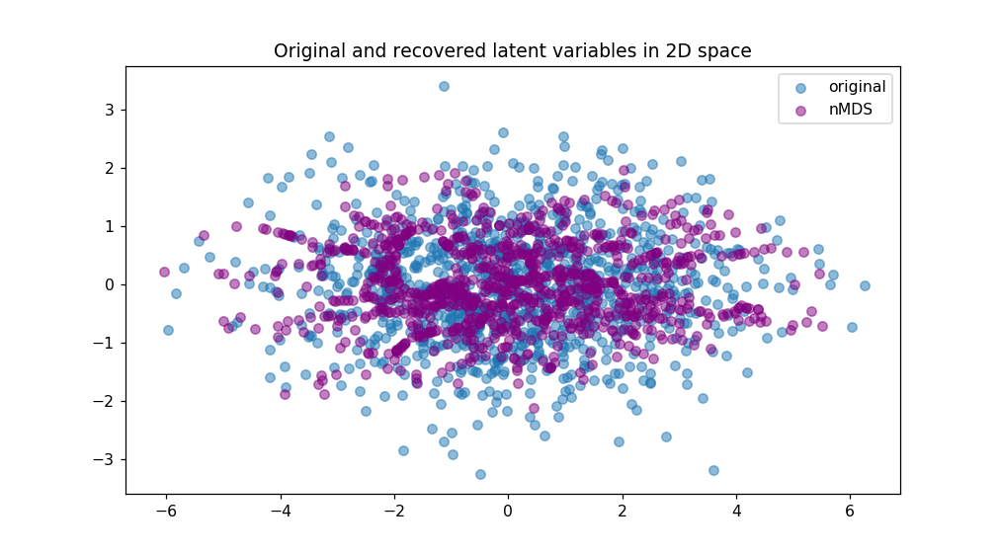

In [38]:
# Plot 3D embedding
scatter3D(y_1, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

isom_1 = manifold.Isomap(n_components=2)
x_isom_1 = pd.DataFrame(isom_1.fit_transform(y_1))
x_isom_1.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5, label = 'original')
ax.scatter(x = 'first',y = 'second',data = x_isom_1,c = 'purple', alpha = 0.5, label = 'nMDS')
ax.set_title('Original and recovered latent variables in 2D space')
ax.legend()


### Non-linear embedding of Gaussian random data

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


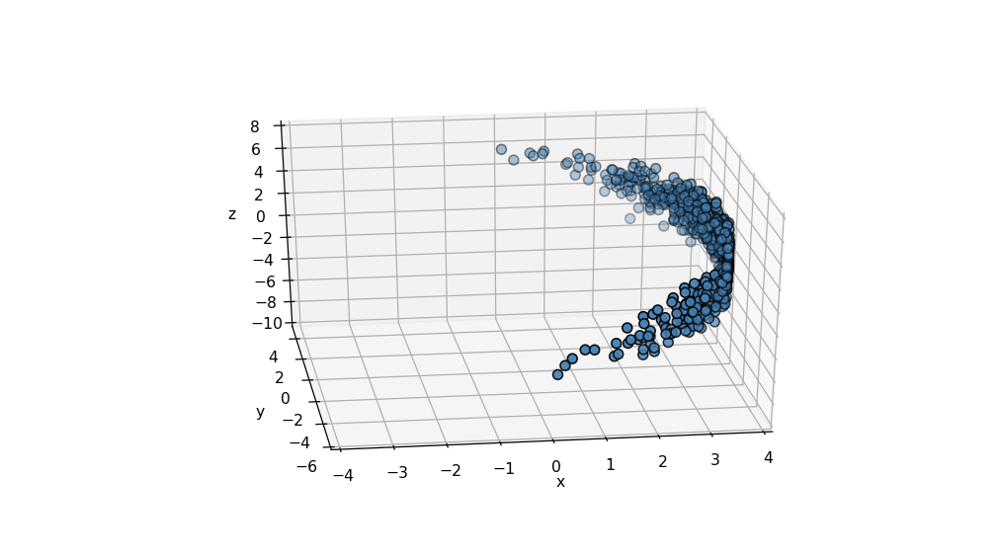

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


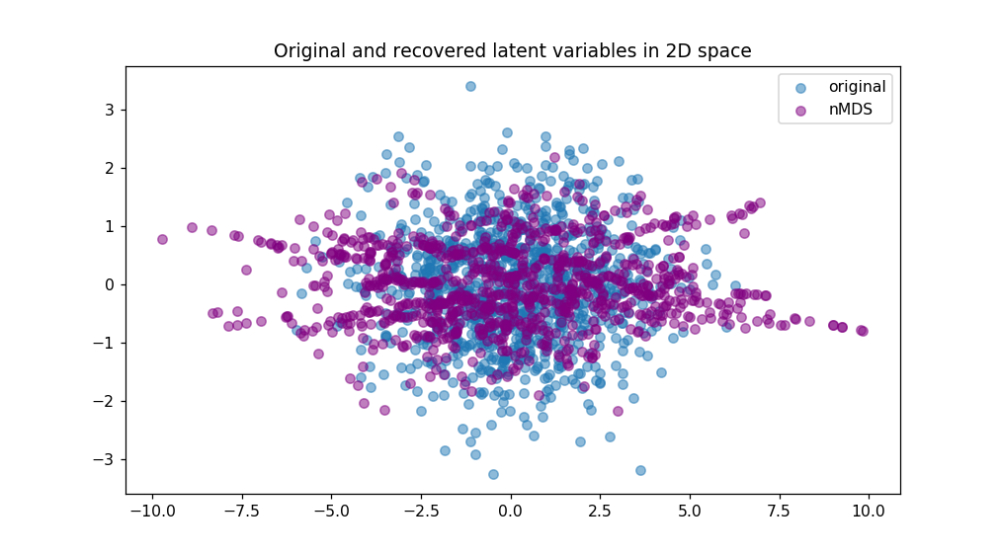

In [39]:
# Plot 3D embedding
scatter3D(y_2, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

isom_2 = manifold.Isomap(n_components=2)
x_isom_2 = pd.DataFrame(isom_2.fit_transform(y_2))
x_isom_2.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_normal, alpha = 0.5, label = 'original')
ax.scatter(x = 'first',y = 'second',data = x_isom_2,c = 'purple', alpha = 0.5, label = 'nMDS')
ax.set_title('Original and recovered latent variables in 2D space')
ax.legend()


### Linear embedding of uniform random data

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


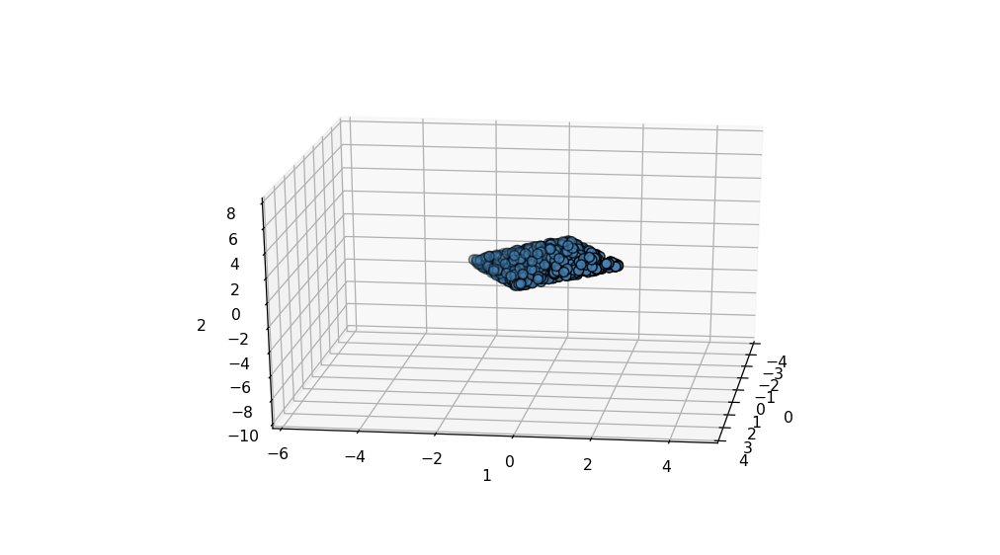

<IPython.core.display.Javascript object>


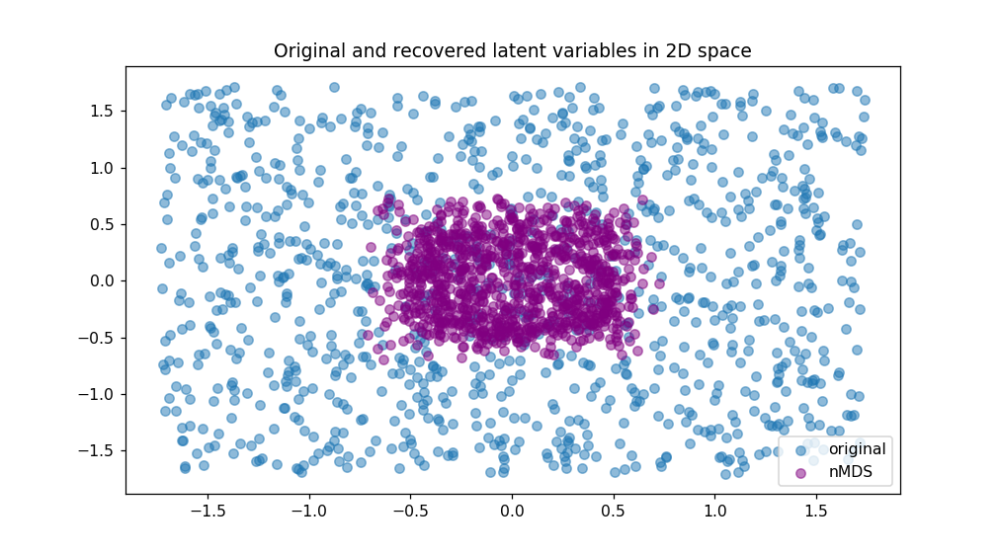

In [43]:
# Divide embedding space values with std
from sklearn.preprocessing import scale
y_3_scaled = pd.DataFrame(scale(y_3,axis=0,with_mean=True,with_std=True))
x_uniform_scaled = pd.DataFrame(scale(x_uniform,axis=0,with_mean=True,with_std=True), columns = ['first','second'])

# PLot embedding in space
scatter3D(y_3_scaled, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

isom_3 = manifold.MDS(n_components=2,dissimilarity="euclidean",metric=False,n_jobs=1,random_state=seed)
x_isom_3 = pd.DataFrame(isom_3.fit_transform(y_3_scaled))
x_isom_3.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'first',y = 'second',data = x_uniform_scaled, alpha = 0.5, label = 'original')
ax.scatter(x = 'first',y = 'second',data = x_isom_3,c = 'purple', alpha = 0.5, label = 'nMDS')
ax.set_title('Original and recovered latent variables in 2D space')
ax.legend()


### Swiss roll

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


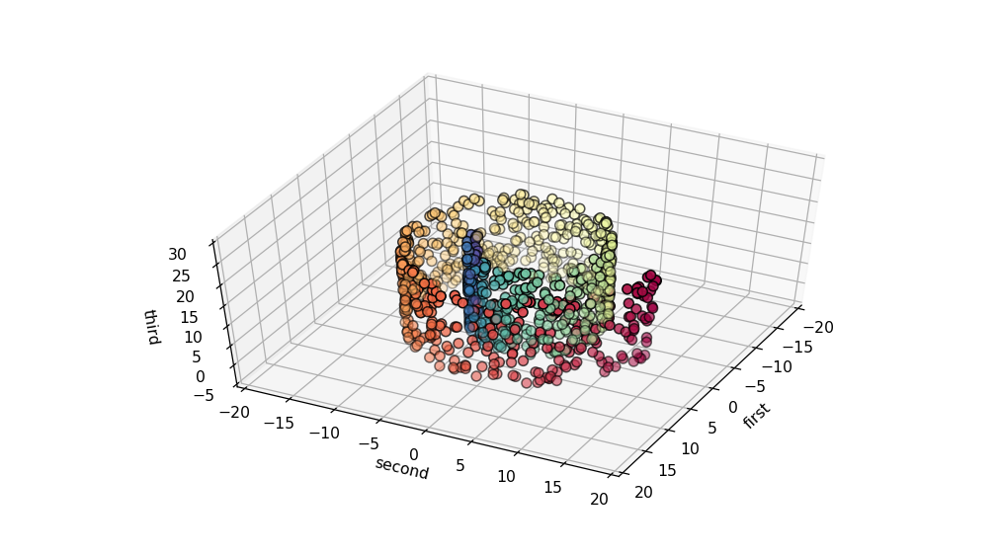

C:\Users\ville_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


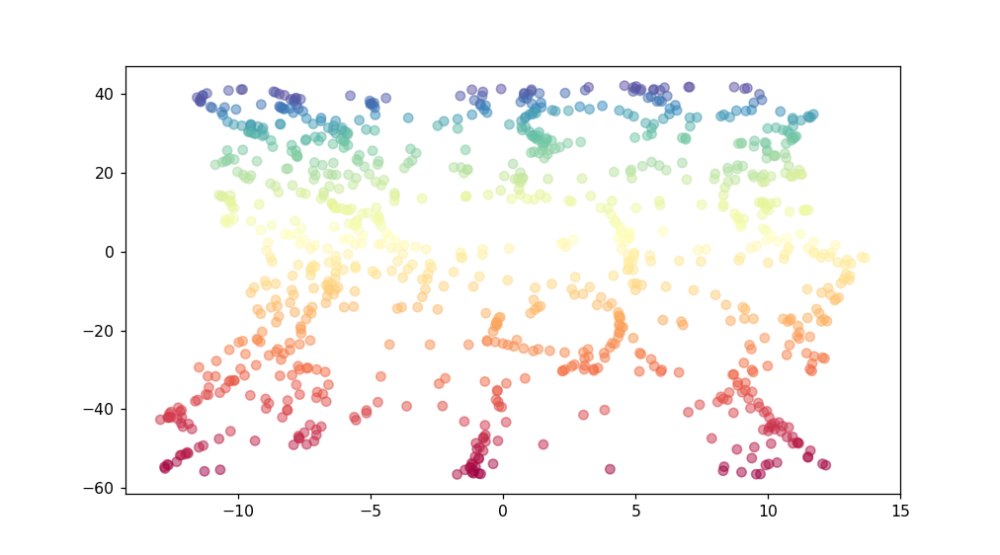

In [26]:
# Plot 3D embedding
scatter3D(df_sr, return_plot = False, xlim=(-20,20), ylim=(-20,20), zlim=(-5,30), color = sr_c, cmap = plt.cm.Spectral_r, azim = 27, elev = 52)

isom_4 = manifold.Isomap(n_components=2)
x_isom_4 = pd.DataFrame(isom_4.fit_transform(df_sr))
x_isom_4.columns = ['first','second']

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1,1,1)
ax.scatter(x = 'second',y = 'first',data = x_isom_4,c=sr_c,cmap = plt.cm.Spectral_r, alpha = 0.5)
ax.set_title('')


## SOM

In [27]:
import rpy2
import tzlocal
%load_ext rpy2.ipython

In [46]:
%%R
coolBlueHotRed = function(n, alpha = 1) {
  rainbow(n, end=4/6, alpha=alpha)[n:1]
}
require(kohonen)

### Linear embedding of Gaussian random data

In [51]:
%%R -i y_1
data_train_matrix = as.matrix(scale(y_1))
names(data_train_matrix) = c("x1","x2","y")
som_grid = somgrid(xdim = 10, ydim=10, topo="hexagonal")
som_1 = som(data_train_matrix, 
                grid=som_grid, 
                rlen=500, 
                alpha=c(0.1,0.01), 
                keep.data = TRUE )

<IPython.core.display.Javascript object>


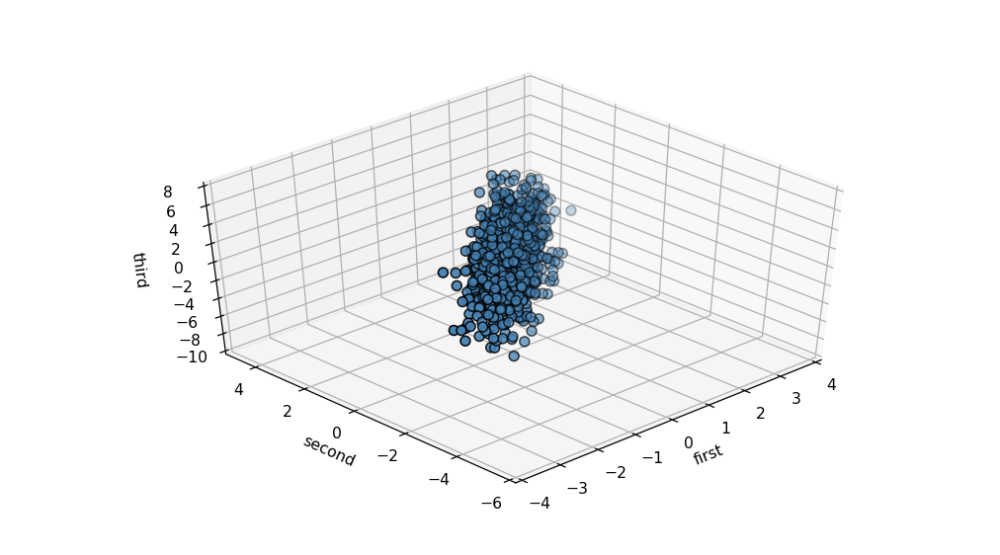

(<matplotlib.figure.Figure at 0x138dde58fd0>,
 <matplotlib.axes._subplots.Axes3DSubplot at 0x138dd798cf8>)

In [45]:
# Plot 3D embedding
scatter3D(y_1, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

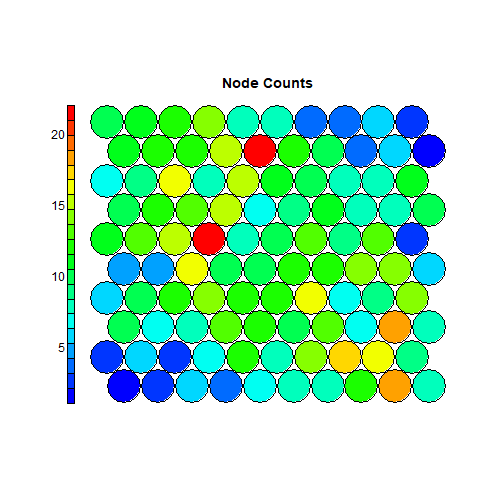

In [52]:
%%R
plot(som_1, type = "counts", main="Node Counts", palette.name=coolBlueHotRed)

### Non-linear embedding of Gaussian random data

In [57]:
%%R -i y_2
data_train_matrix = as.matrix(scale(y_2))
names(data_train_matrix) = c("x1","x2","y")
som_grid = somgrid(xdim = 15, ydim=15, topo="hexagonal")
som_2 = som(data_train_matrix, 
                grid=som_grid, 
                rlen=500, 
                alpha=c(0.1,0.01), 
                keep.data = TRUE )

<IPython.core.display.Javascript object>


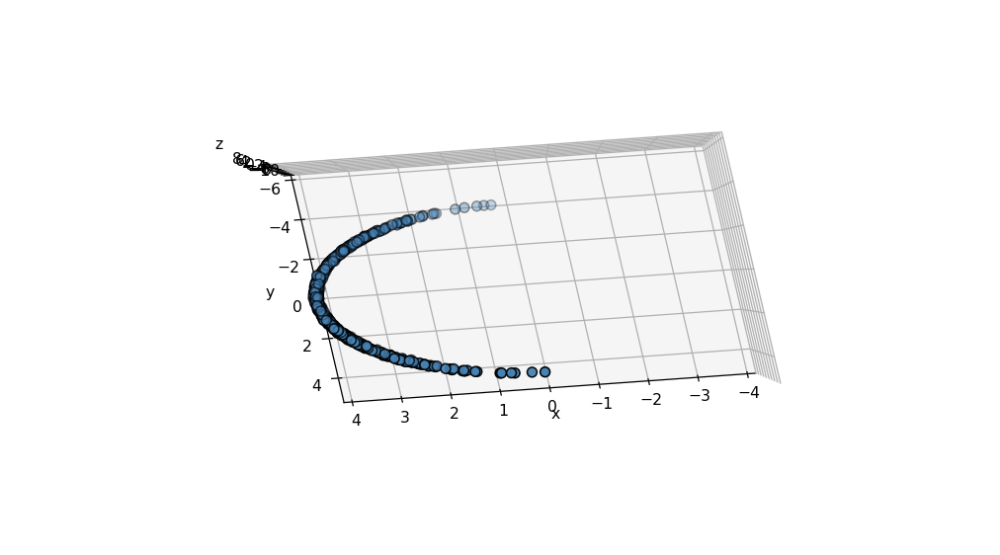

(<matplotlib.figure.Figure at 0x138888fc668>,
 <matplotlib.axes._subplots.Axes3DSubplot at 0x13888dda0f0>)

In [58]:
# Plot 3D embedding
scatter3D(y_2, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

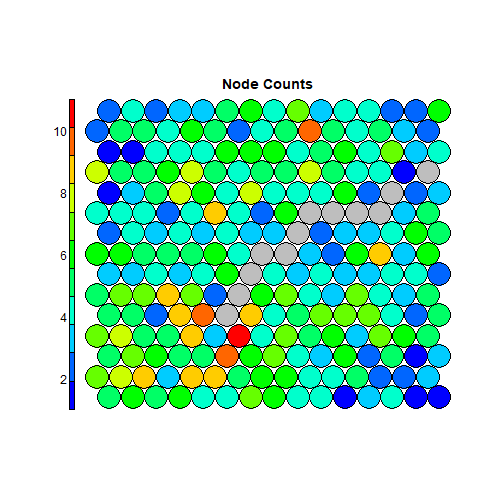

In [59]:
%%R
plot(som_2, type = "counts", main="Node Counts", palette.name=coolBlueHotRed)

### Linear embedding of uniform random data

In [61]:
%%R -i y_3
data_train_matrix = as.matrix(scale(y_3))
names(data_train_matrix) = c("x1","x2","y")
som_grid = somgrid(xdim = 15, ydim=15, topo="hexagonal")
som_3 = som(data_train_matrix, 
                grid=som_grid, 
                rlen=500, 
                alpha=c(0.1,0.01), 
                keep.data = TRUE )

<IPython.core.display.Javascript object>


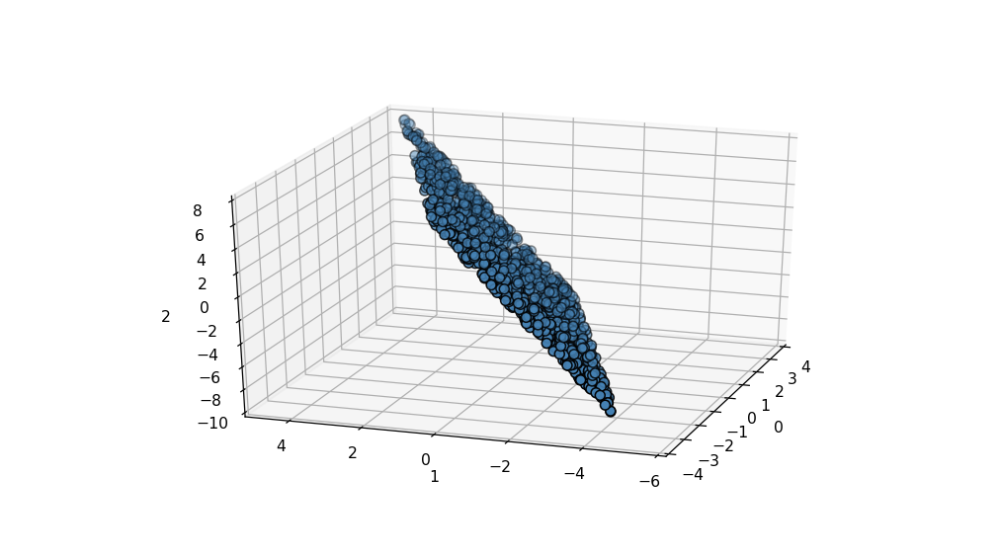

(<matplotlib.figure.Figure at 0x1388a0f2710>,
 <matplotlib.axes._subplots.Axes3DSubplot at 0x13889c7df28>)

In [64]:
# Plot 3D embedding
scatter3D(y_3, azim = 78, elev = 10, xlim=(-4,4),ylim=(-6,5),zlim=(-10,8))

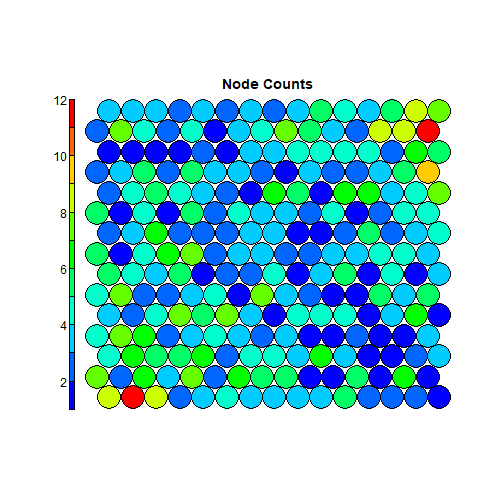

In [65]:
%%R
plot(som_3, type = "counts", main="Node Counts", palette.name=coolBlueHotRed)

### Swiss roll

In [69]:
%%R -i df_sr
data_train_matrix = as.matrix(scale(df_sr))
names(data_train_matrix) = c("x1","x2","y")
som_grid = somgrid(xdim = 25, ydim=15, topo="hexagonal")
som_4 = som(data_train_matrix, 
                grid=som_grid, 
                rlen=500, 
                alpha=c(0.1,0.01), 
                keep.data = TRUE )

<IPython.core.display.Javascript object>


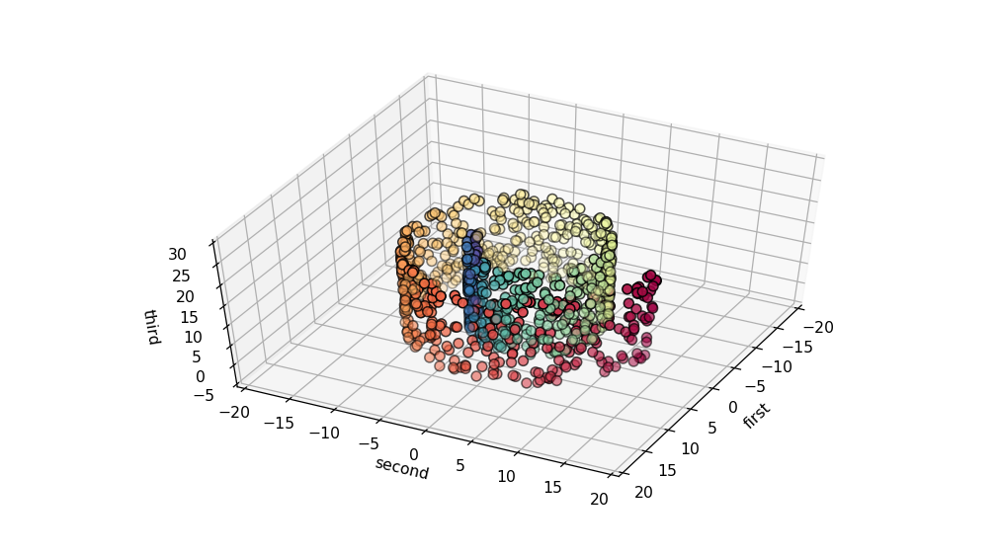

In [67]:
scatter3D(df_sr, return_plot = False, xlim=(-20,20), ylim=(-20,20), zlim=(-5,30), color = sr_c, cmap = plt.cm.Spectral_r, azim = 27, elev = 52)

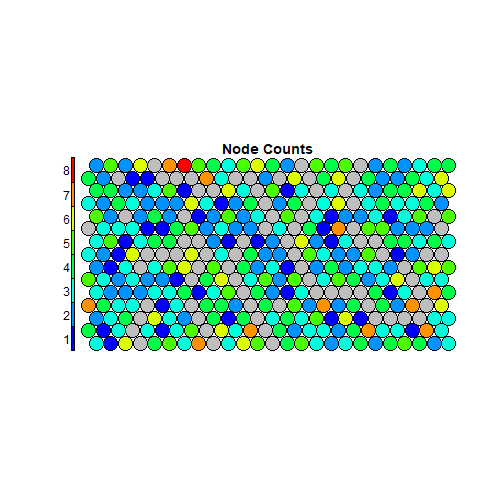

In [70]:
%%R
plot(som_4, type = "counts", main="Node Counts", palette.name=coolBlueHotRed)

# Appendix

## On notation

I like to think datasets such that observations correspond to rows and features correspond to columns. In the reference book, however, datasets are usually thought of as trasposed to make less tranposes appear in the formulas. This in mind, let  $\mathbf{Y}^{T}$ denote a $NxD$ cross-sectional dataset of measured obsevations, where $N$ denotes the amount of observations and $D$ denotes the number of observed dimensions. Then trivially $\mathbf{Y}$ is a transposed version of the same dataset with dimensions $DxN$. In this case for $n \in N$
$$\mathbf{y_n} = [ y_{1,n}, \dots, y_{d,n}, \dots , y_{D,n}]^T$$

is a $Dx1$ dimensional vector correponding to features of a single observations. When $N$ observations are stacked (columnwise) to a matrix, we have for $DxN$ matrix $\mathbf{Y}$ that

\begin{align*}
\mathbf{Y} = [\mathbf{y_1}, \dots , \mathbf{y_n}, \dots , \mathbf{y_N}]
\end{align*}

We could also stack the matrix rowwise: if
$$\mathbf{\upsilon_d} = [ \upsilon_{d,1}, \dots, \upsilon_{d,n}, \dots , \upsilon_{d,N}]$$

denotes a row vector of all measured observations of feature $d$, then 

\begin{align*}
\mathbf{Y} = [\mathbf{\upsilon_1}, \dots , \mathbf{\upsilon_d}, \dots , \mathbf{\upsilon_D}]^T
\end{align*}


## On pre-processing
In order to run dimensionalty reduction algorithms we often need to center the observed data. What this means is to reduce the mean of all observations from each single observation along one feature dimesion. That is, we replace every cell $y_{d,n}$ in $\mathbf{Y}$ with demeaned version:

\begin{align*}
y_{d,n} \leftarrow y_{d,n} - E(\mathbf{\upsilon_d}) \ \ \forall n,d
\end{align*}

Since the expected value is unknow, it is approximated byt the sample mean:

\begin{align*}
E(\mathbf{\upsilon_d}) \approx \frac{1}{N} \sum_{n=1}^{N} \upsilon_{d,n} \ \ \forall d
\end{align*}

As a vector, the (columnwise) sample mean of $\mathbf{Y}$, $\mathbf{\bar{y}}$, is a $Dx1$ vector 
$$\mathbf{\bar{y}} = [E(\mathbf{\upsilon_d}), \dots, E(\mathbf{\upsilon_d}), \dots , E(\mathbf{\upsilon_d})]^T$$

As matrix calculation the mean vector is given by
\begin{align*}
\mathbf{\bar{y}} = \frac{1}{N} \mathbf{Y} \mathbf{1}_N \mathbf{1}_N^T
\end{align*}

and the demeaned version of matrx $\mathbf{Y}$, $\mathbf{\bar{Y}}$ , as

\begin{align*}
\mathbf{\bar{Y}} \equiv \mathbf{Y} - \mathbf{\bar{y}}
\end{align*}

Fo notational convenience, in what follow we simply use $\mathbf{Y}$ even when referring to demeaned version. 

**Some words about standardizing $\mathbf{y}$.**

Sometimes demeaning is not enough but we also need standardize the data. Such a case arises e.g. if the features are of different magnitudes by measuring convetion (e.g. kilometers vs. meters) or are of different maginute by their nature (e.g. kilokramgs vs. kilomters). This is no free lunch, however, as there might be cases where standardization makes things worse (e.g. increases importance of noise), see page 26. This means standardization should be decided case-by-case basis.

One way to standardize the data is, after demeaning, to divide the observation feature value by the sample standard deviation of that feature. Demeaning and dividing by stadard deviation essentially means applying the z-score!

Let's see an example of simple demeaning as well as applying z-scroring from scikit learn.

In [33]:
#################################################
# Example on demeaning NxD and DxN matrices where
# N represents amount of observation.
#################################################

# Create example array Y and its transposed version.
Y_T = np.array([[2,5,1], [2,6,3], [8,5,6], [2,2,3]])
Y = Y_T.T

# Display these arrays.
print("Matrix Y_T on the left, Y on the right.")
display_sbs(pd.DataFrame(Y_T), pd.DataFrame(Y))

# Define function for demeaning.
def center_array(A,ax=0):
    """
    Function to demean 2D numpy array A. ax determines
    the axis along which demeaning is performed.
    ax=0: columns represent observation values for single feature.
    ax=1: rows represent observation values for single feature.
    """
    mean = A.mean(axis=ax)
    if (ax==0):
        return A - mean[np.newaxis,:]
    elif (ax==1):
        return A - mean[:,np.newaxis]
    else:
        raise ValueError('ax hould be either 0 or 1.')

# Run arrays through demeaning and display results. 
print("Demeaned version of Y_T on the left, demeaned version of Y on the right.")
display_sbs(pd.DataFrame(center_array(Y_T,ax=0)), pd.DataFrame(center_array(Y,ax=1)))

Matrix Y_T on the left, Y on the right.


0 
 1 
 2 
 
 
 
 
 0 
 2 
 5 
 1 
 
 
 1 
 2 
 6 
 3 
 
 
 2 
 8 
 5 
 6 
 
 
 3 
 2 
 2 
 3 
 
 
 
 
 
 
 0 
 1 
 2 
 3 
 
 
 
 
 0 
 2 
 2 
 8 
 2 
 
 
 1 
 5 
 6 
 5 
 2 
 
 
 2 
 1 
 3 
 6 
 3

Demeaned version of Y_T on the left, demeaned version of Y on the right.


0 
 1 
 2 
 
 
 
 
 0 
 -1.5 
 0.5 
 -2.25 
 
 
 1 
 -1.5 
 1.5 
 -0.25 
 
 
 2 
 4.5 
 0.5 
 2.75 
 
 
 3 
 -1.5 
 -2.5 
 -0.25 
 
 
 
 
 
 
 0 
 1 
 2 
 3 
 
 
 
 
 0 
 -1.50 
 -1.50 
 4.50 
 -1.50 
 
 
 1 
 0.50 
 1.50 
 0.50 
 -2.50 
 
 
 2 
 -2.25 
 -0.25 
 2.75 
 -0.25

In [34]:
#################################################
# Example on demeaning and/or scaling NxD and DxN
# matrices where N represents amount of observation.
#################################################
from sklearn.preprocessing import scale

Y_T = np.array([[2,5,1], [2,6,3], [8,5,6], [2,2,3]])
Y = Y_T.T

# Display these arrays.
print("Matrix Y_T on the left, Y on the right.")
display_sbs(pd.DataFrame(Y_T), pd.DataFrame(Y))

# Run arrays through demeaning and display results. 
print("Demeaned version of Y_T on the left, demeaned version of Y on the right.")
display_sbs(pd.DataFrame(scale(Y_T, axis=0,with_mean=True,with_std=False))
          ,pd.DataFrame(scale(Y, axis=1,with_mean=True,with_std=False)))

## Run arrays through standardization and display results. 
print("Standardized version of Y_T on the left, Standardized version of Y on the right.")
display_sbs(pd.DataFrame(scale(Y_T, axis=0,with_mean=True,with_std=True))
          ,pd.DataFrame(scale(Y, axis=1,with_mean=True,with_std=True)))


Matrix Y_T on the left, Y on the right.


0 
 1 
 2 
 
 
 
 
 0 
 2 
 5 
 1 
 
 
 1 
 2 
 6 
 3 
 
 
 2 
 8 
 5 
 6 
 
 
 3 
 2 
 2 
 3 
 
 
 
 
 
 
 0 
 1 
 2 
 3 
 
 
 
 
 0 
 2 
 2 
 8 
 2 
 
 
 1 
 5 
 6 
 5 
 2 
 
 
 2 
 1 
 3 
 6 
 3

Demeaned version of Y_T on the left, demeaned version of Y on the right.


C:\Users\ville_000\Anaconda3\lib\site-packages\sklearn\utils\validation.py:429: DataConversionWarning: Data with input dtype int32 was converted to float64 by the scale function.
  warnings.warn(msg, _DataConversionWarning)


0 
 1 
 2 
 
 
 
 
 0 
 -1.5 
 0.5 
 -2.25 
 
 
 1 
 -1.5 
 1.5 
 -0.25 
 
 
 2 
 4.5 
 0.5 
 2.75 
 
 
 3 
 -1.5 
 -2.5 
 -0.25 
 
 
 
 
 
 
 0 
 1 
 2 
 3 
 
 
 
 
 0 
 -1.50 
 -1.50 
 4.50 
 -1.50 
 
 
 1 
 0.50 
 1.50 
 0.50 
 -2.50 
 
 
 2 
 -2.25 
 -0.25 
 2.75 
 -0.25

Standardized version of Y_T on the left, Standardized version of Y on the right.


0 
 1 
 2 
 
 
 
 
 0 
 -0.577350 
 0.333333 
 -1.260252 
 
 
 1 
 -0.577350 
 1.000000 
 -0.140028 
 
 
 2 
 1.732051 
 0.333333 
 1.540308 
 
 
 3 
 -0.577350 
 -1.666667 
 -0.140028 
 
 
 
 
 
 
 0 
 1 
 2 
 3 
 
 
 
 
 0 
 -0.577350 
 -0.577350 
 1.732051 
 -0.577350 
 
 
 1 
 0.333333 
 1.000000 
 0.333333 
 -1.666667 
 
 
 2 
 -1.260252 
 -0.140028 
 1.540308 
 -0.140028

## Linear data model



Ofter we are working with a linear data model

\begin{align}
\mathbf{y}_n = \mathbf{W} \mathbf{x}_n \label{eq:lindatamodel}
\end{align}

where $\mathbf{y_n}$ is the feature vector for observation $n$ from above, 

$$\mathbf{x_n} = [ y_{1,n}, \dots, y_{p,n}, \dots , y_{P,n}]^T$$

is the $Px1$ column vector of latent variables in $P < D$ dimensions, and $W$ is a $DxP$ dimensional transformation matrix. Different models can put different restrictions on $W$.

## PCA

For a given single observation, PCA assumes the data model from equation (\ref{eq:lindatamodel}):

\begin{align*}
\mathbf{y}_n = \mathbf{W} \mathbf{x}_n
\end{align*}

where values in $\mathbf{y}_n$ and $\mathbf{x}_n$ are centered and possibly standardized. $\mathbf{W}$ is constrained to be an axis change, meaning that whe columns are orthogonal to each other of unit norm. In other words, $\mathbf{W}^T \mathbf{W} = \mathbf{I}_P$ (but premuted product $\mathbf{W}\mathbf{W}^T$ might differ from $\mathbf{I}_D$).

There are several criteria leading to PCA solution of dimensionality reduction. The original idea by Pearson was to minimize the reconstruction error in mean-square sense. Later idea - leading to same result - by Hotelling was to preserve maximal amount of global variance of the original dataset. The third criteria is (Euclidian) distannce (or more accurately, scalar product) preservance between embedding and latent spaces, which is also the criterium for classical metrid multi-dimensional scaling, making results of these two different approaches equivalent.

**Reconstruction here**

**Variance preservance here**


## Multidimensional scaling

Multidimesional scaling (MDS) refers to a family of methods. <i>Scaling</i> refers to methods that construct a configuratation of points in a target metric space from information about interpoint distances (metric MDS).

### Classical metric multidimensional scaling (cmMDS)
(Lee & Verleysen 2007 p. 74->)<br>
cmMDS is not a true distance-preserving method. Rather, it preserves pairwise scalar products (these are closely related, however). Like PCA, metric MDS relies on a similar generative model where only an orthogonal axis chnage separates the observed variables in $\mathbf{y}_n$ and the latent ones, stored in $\mathbf{x}_n$:

$$\mathbf{y}_n = \mathbf{W} \mathbf{x}_n $$

where features in $\mathbf{x}_n$ are assumed to be independent or at least uncorrelated.
We can give a short-hand notation for the scaler-product between locational vectors of observations $i$ and $j$ in embedding space:

$$s_{y}(i,j) = s \big( \mathbf{y}_i , \mathbf{y}_j) \big) = \langle \mathbf{y}_i , \mathbf{y}_j \rangle $$

Then we can write for matrix of scalar products, called <i>Gram matrix</i>, as

\begin{align}
\mathbf{S} = [s_{y}(i,j)]_{i\leq i, j \leq N} &= \mathbf{Y}^T \mathbf{Y} \nonumber \\
& = (\mathbf{W}\mathbf{X})^T (\mathbf{W}\mathbf{X}) \nonumber \\
& = \mathbf{W}^T \mathbf{X}^T \mathbf{W} \mathbf{X} \nonumber \\
& = \mathbf{X}^T \mathbf{X} \label{eq:S_a} \\
\end{align}

For cmMDS it is not required that $\mathbf{Y}$ is known, Gram amtrix $\mathbf{S}$ suffices. If $\mathbf{Y}$ is known, then the Gram matrix can be obtained from it by the above formula. In order to obtain the estimated latent variables $\mathbf{\hat{X}}$, we first apply eigenvalue decomposition on Gram's matrix:

\begin{align}
\mathbf{S} &= \mathbf{U} \mathbf{\Lambda} \mathbf{U}^T \nonumber \\
& = (\mathbf{U}\mathbf{\Lambda}^{1/2}) (\mathbf{\Lambda}^{1/2}\mathbf{U}^{T}) \nonumber \\
& = (\mathbf{\Lambda}^{1/2}\mathbf{U}^{T})^{T} (\mathbf{\Lambda}^{1/2}\mathbf{U}^{T}) \label{eq:S_b} \\
\end{align}

Now it can be seen comparing (\ref{eq:S_a}) and (\ref{eq:S_b}) that we have $\mathbf{X} = (\mathbf{\Lambda}^{1/2}\mathbf{U}^{T})$. If we now sort eigenvalues (values on the diagonal in $\mathbf{\Lambda}$) in descending order, then the $P$-dimensional estimated latent variables can be obtained from

\begin{align}
\mathbf{\hat{X}} &= \mathbf{I}_{PxN} \mathbf{\Lambda}^{1/2} \mathbf{U}^{T} \label{eq:cmmds_latents} \\
\end{align}

where $\mathbf{I}_{PxN}$ just limits the estimated dimensions to first $P$ (to first $P$ eigenvalues). A reduced Gram's matrix corresponding to $\mathbf{\hat{X}}$ would be $\mathbf{\hat{S}} = \mathbf{\hat{X}}^T \mathbf{\hat{X}}$, with elements $s_{\hat{x}}(i,j) = s \big( \mathbf{\hat{x}}_i , \mathbf{\hat{x}}_j \big) = \langle \mathbf{\hat{x}}_i , \mathbf{\hat{x}}_j \rangle $. Since we choose the largest eigenvalues, we are esenttially trying to bring the scalar products in latent $P$-dimensional space as close to scalar products in original $D$-dimensional embedding space. Thus, the corresponding objective function that is minimized with cmMDS can be written as

\begin{align}
E_{cmMDS} = \sum_{i,j=1}^{N} \big( s_{y}(i,j) - s_{\hat{x}}(i,j) \big)^2 \label{eq:of1} \\
\end{align}

### Metric multidimensional scaling (mMDS)
(Lee & Verleysen 2007 p. 80->)<br>

cmMDS has been generalized to metric MDS (mMDS) where Euclidian distances are explicitly preserved instead of scaler products. Thus, objective function in equation (\ref{eq:of1}) is changed to following objective function (also called <i>stress function</i>):

\begin{align}
E_{mMDS} = \sum_{i,j=1}^{N} w_{ij} \big( d_{y}(i,j) - d_{\hat{x}}(i,j) \big)^2 \label{eq:of2} \\
\end{align}

where $w_{ij} \geq 0$ are weightes. usually equal to 1 except for missing data for which they are equal to 0.

### Non-metric multidimensional scaling (nMDS)

## Isomap
(Lee & Verleysen 2007 p. 102->)<br>
Isomap is the generalization of cmMDS where instead of Euclidian pairwise distances we use <i>graph distance</i>, which approximates distance along the manifold (or <i>geodesic distance</i>). Just by introducing the graph distance, the purely linear cmMDS becomes a non-linear method. Since the non-linearity arises from change of metric rather than inherently non-linear model like in nMDS-family, Isomap is rather fast (algebraical solution) compared to e.g. nMDS methods (relying on procedures like gradient descent).

A pseudo-algorithm for Isomapis as follows:
 - Build a graph with either the K-rule or the $\epsilon$-rule.
 - Weight the graph by labelling each edge with its Euclidian length. 
 - Compute all pairwise graph distances with Dijkstras's algorithm, square them, and store them in matrix $D$.
 - Convert the matrix of distances $D$ into a Gram matrix $S$ by double centering.
 - Once the Gram matrix is known, the rest is done exactly as with cmMDS, equations \ref{eq:S_a} and \ref{eq:cmmds_latents}.

## Kernal PCA
Similarly to Isompa, kPCAThis generalizes cmMDS but in a different way. It is not used much in dimensionality reduction, however, as parameterizing kPCA is tedious.

## SOM
(Lee & Verleysen 2007 p. 135->)<br>

## Locally Linear Embedding (LLE)
(Lee & Verleysen 2007 p. 152->)<br>

## Spectral Embedding (Laplacian Eigenmaps)
(Lee & Verleysen 2007 p. 159->)<br>

## tSNE
(Not found in Lee & Verleysen 2007)<br>